In [3]:
%matplotlib inline
%load_ext autoreload
%autoreload 2

import os,sys
import matplotlib.pyplot as plt
import numpy as np
import cv2
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms, datasets, models

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [4]:
from PIL import Image

In [5]:
from os.path import splitext
from os import listdir
train_imgs_dir = 'data/train/image/'
train_mask_dir = 'data/train/mask/'
val_imgs_dir = 'data/val/image/'
val_mask_dir = 'data/val/mask/'

# An example

In [4]:
mask = np.array(cv2.imread('data/train/mask/102816_lh_segment_224.png'))
mask_ = np.zeros((224,224,3))

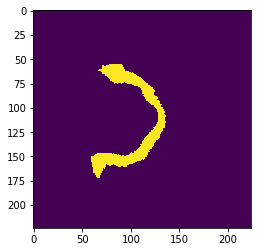

In [10]:
mask_[:,:,0] = (mask[:,:,0] != 255) & (mask[:,:,1] == 255)
plt.imshow(mask_[:,:,0])

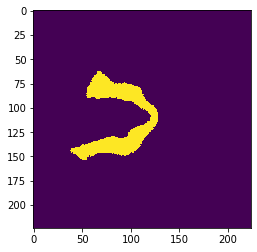

In [11]:
mask_[:,:,1] = (mask[:,:,1] != 255) & (mask[:,:,2] != 255)
plt.imshow(mask_[:,:,1])

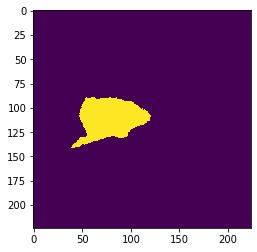

In [12]:
mask_[:,:,2] = (mask[:,:,0] != 255) & (mask[:,:,2] == 255)
plt.imshow(mask_[:,:,2])

# Dataset

In [7]:
class HCPDataset(Dataset):
    def __init__(self, imgs_dir, masks_dir, transform=None):
        self.imgs_dir = imgs_dir
        self.masks_dir = masks_dir
        self.transform = transform
        self.sids = [splitext(file)[0][:-4] for file in listdir(self.imgs_dir) if file.endswith('224.png')]
#         self.sids = [splitext(file)[0] for file in listdir(imgs_dir)
#                     if not file.startswith('.')]
    
    def __len__(self):
        return len(self.sids)
    
    def __getitem__(self, i):  
        idx = self.sids[i]
        img_path = os.path.join(self.imgs_dir, idx+'_224.png')
        msk_path = os.path.join(self.masks_dir, idx+'_segment_224.png')
        image = np.array(cv2.imread(img_path))
#         image = cv2.resize(image, (432, 432))
        #mask = np.array(cv2.imread(os.path.join(self.masks_dir, idx+'.png'))[:,:,0])
        mask = np.array(cv2.imread(msk_path))
        mask_ = np.zeros((224,224,3))
        mask_[:,:,0] = (mask[:,:,0] != 255) & (mask[:,:,1] == 255)
        mask_[:,:,1] = (mask[:,:,1] != 255) & (mask[:,:,2] != 255)
        mask_[:,:,2] = (mask[:,:,0] != 255) & (mask[:,:,2] == 255)

        if self.transform:
            image = self.transform(image)
#             mask = self.transform(mask)
            mask = transforms.functional.to_tensor(mask_)
        return [idx, image, mask]

# use same transform for train/val for this example
trans = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225]) # imagenet
])

train_set = HCPDataset(train_imgs_dir, train_mask_dir, trans)
val_set = HCPDataset(val_imgs_dir, val_mask_dir, trans)

image_datasets = {
    'train': train_set, 'val': val_set
}

batch_size = 2

dataloaders = {
    'train': DataLoader(train_set, batch_size=batch_size, shuffle=True, num_workers=0),
    'val': DataLoader(val_set, batch_size=batch_size, shuffle=True, num_workers=0)
}

dataset_sizes = {
    x: len(image_datasets[x]) for x in image_datasets.keys()
}

dataset_sizes

{'train': 170, 'val': 155}

torch.Size([2, 3, 224, 224]) torch.Size([2, 3, 224, 224])
-2.117904 2.64 0.4824498 1.7248865
0.0 1.0 0.03808261585884354 0.1913957424505344


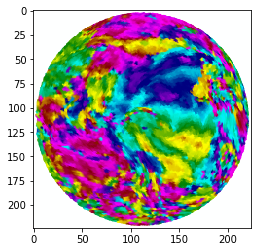

In [8]:
import torchvision.utils

def reverse_transform(inp):
    inp = inp.numpy().transpose((1, 2, 0))
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    inp = std * inp + mean
    inp = np.clip(inp, 0, 1)
    inp = (inp * 255).astype(np.uint8)
    
    return inp

# Get a batch of training data
index, inputs, masks = next(iter(dataloaders['val']))

print(inputs.shape, masks.shape)
for x in [inputs.numpy(), masks.numpy()]:
    print(x.min(), x.max(), x.mean(), x.std())

plt.imshow(reverse_transform(inputs[1]))

# Basemodel-Resnet

In [9]:
from torchvision import models

base_model = models.resnet18(pretrained=True)
    
list(base_model.children())[:-2]

[Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False),
 BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True),
 ReLU(inplace=True),
 MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False),
 Sequential(
   (0): BasicBlock(
     (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
     (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
     (relu): ReLU(inplace=True)
     (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
     (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
   )
   (1): BasicBlock(
     (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
     (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
     (relu): ReLU(inplace=True)
     (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), pad

# ResNet-Unet

In [10]:
# check keras-like model summary using torchsummary
import torch
from torchsummary import summary
#device = torch.device('cpu')
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
base_model = base_model.to(device)

summary(base_model, input_size=(3, 224,224))#, device = 'cpu'

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 112, 112]           9,408
       BatchNorm2d-2         [-1, 64, 112, 112]             128
              ReLU-3         [-1, 64, 112, 112]               0
         MaxPool2d-4           [-1, 64, 56, 56]               0
            Conv2d-5           [-1, 64, 56, 56]          36,864
       BatchNorm2d-6           [-1, 64, 56, 56]             128
              ReLU-7           [-1, 64, 56, 56]               0
            Conv2d-8           [-1, 64, 56, 56]          36,864
       BatchNorm2d-9           [-1, 64, 56, 56]             128
             ReLU-10           [-1, 64, 56, 56]               0
       BasicBlock-11           [-1, 64, 56, 56]               0
           Conv2d-12           [-1, 64, 56, 56]          36,864
      BatchNorm2d-13           [-1, 64, 56, 56]             128
             ReLU-14           [-1, 64,

In [11]:
import torch
import torch.nn as nn

def convrelu(in_channels, out_channels, kernel, padding):
    return nn.Sequential(
        nn.Conv2d(in_channels, out_channels, kernel, padding=padding),
        nn.ReLU(inplace=True),
    )

class ResNetUNet(nn.Module):

    def __init__(self, n_class):
        super().__init__()
        
        self.base_model = models.resnet18(pretrained=True)
        
        self.base_layers = list(base_model.children())                
        
        self.layer0 = nn.Sequential(*self.base_layers[:3]) # size=(N, 64, x.H/2, x.W/2)
        self.layer0_1x1 = convrelu(64, 64, 1, 0)
        self.layer1 = nn.Sequential(*self.base_layers[3:5]) # size=(N, 64, x.H/4, x.W/4)        
        self.layer1_1x1 = convrelu(64, 64, 1, 0)       
        self.layer2 = self.base_layers[5]  # size=(N, 128, x.H/8, x.W/8)        
        self.layer2_1x1 = convrelu(128, 128, 1, 0)  
        self.layer3 = self.base_layers[6]  # size=(N, 256, x.H/16, x.W/16)        
        self.layer3_1x1 = convrelu(256, 256, 1, 0)  
        self.layer4 = self.base_layers[7]  # size=(N, 512, x.H/32, x.W/32)
        self.layer4_1x1 = convrelu(512, 512, 1, 0)  
        
        self.upsample = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True)
        
        self.conv_up3 = convrelu(256 + 512, 512, 3, 1)
        self.conv_up2 = convrelu(128 + 512, 256, 3, 1)
        self.conv_up1 = convrelu(64 + 256, 256, 3, 1)
        self.conv_up0 = convrelu(64 + 256, 128, 3, 1)
        
        self.conv_original_size0 = convrelu(3, 64, 3, 1)
        self.conv_original_size1 = convrelu(64, 64, 3, 1)
        self.conv_original_size2 = convrelu(64 + 128, 64, 3, 1)
        
        self.conv_last = nn.Conv2d(64, n_class, 1)
        
    def forward(self, input):
        x_original = self.conv_original_size0(input)
        x_original = self.conv_original_size1(x_original)
        
        layer0 = self.layer0(input)            
        layer1 = self.layer1(layer0)
        layer2 = self.layer2(layer1)
        layer3 = self.layer3(layer2)        
        layer4 = self.layer4(layer3)
        
        layer4 = self.layer4_1x1(layer4)
        x = self.upsample(layer4)
        layer3 = self.layer3_1x1(layer3)
        x = torch.cat([x, layer3], dim=1)
        x = self.conv_up3(x)
 
        x = self.upsample(x)
        layer2 = self.layer2_1x1(layer2)
        x = torch.cat([x, layer2], dim=1)
        x = self.conv_up2(x)

        x = self.upsample(x)
        layer1 = self.layer1_1x1(layer1)
        x = torch.cat([x, layer1], dim=1)
        x = self.conv_up1(x)

        x = self.upsample(x)
        layer0 = self.layer0_1x1(layer0)
        x = torch.cat([x, layer0], dim=1)
        x = self.conv_up0(x)
        
        x = self.upsample(x)
        x = torch.cat([x, x_original], dim=1)
        x = self.conv_original_size2(x)        
        
        out = self.conv_last(x)        
        
        return out

In [12]:
# check keras-like model summary using torchsummary

from torchsummary import summary

#device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = ResNetUNet(3)
model = model.to(device)

summary(model, input_size=(3, 224, 224))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 224, 224]           1,792
              ReLU-2         [-1, 64, 224, 224]               0
            Conv2d-3         [-1, 64, 224, 224]          36,928
              ReLU-4         [-1, 64, 224, 224]               0
            Conv2d-5         [-1, 64, 112, 112]           9,408
       BatchNorm2d-6         [-1, 64, 112, 112]             128
              ReLU-7         [-1, 64, 112, 112]               0
         MaxPool2d-8           [-1, 64, 56, 56]               0
            Conv2d-9           [-1, 64, 56, 56]          36,864
      BatchNorm2d-10           [-1, 64, 56, 56]             128
             ReLU-11           [-1, 64, 56, 56]               0
           Conv2d-12           [-1, 64, 56, 56]          36,864
      BatchNorm2d-13           [-1, 64, 56, 56]             128
             ReLU-14           [-1, 64,

# Training

In [13]:
from collections import defaultdict
import torch.nn.functional as F
import torch
from loss import dice_loss

def calc_loss(pred, target, metrics, bce_weight=0.5):
    pred = pred.to(torch.float64)
    bce = F.binary_cross_entropy_with_logits(pred, target)
        
    pred = torch.sigmoid(pred)
    dice = dice_loss(pred, target)
    
    loss = bce * bce_weight + dice * (1 - bce_weight)
    
    metrics['bce'] += bce.data.cpu().numpy() * target.size(0)
    metrics['dice'] += dice.data.cpu().numpy() * target.size(0)
    metrics['loss'] += loss.data.cpu().numpy() * target.size(0)
    
    return loss

def print_metrics(metrics, epoch_samples, phase):    
    outputs = []
    for k in metrics.keys():
        outputs.append("{}: {:4f}".format(k, metrics[k] / epoch_samples))
        
    print("{}: {}".format(phase, ", ".join(outputs)))    

def train_model(model, optimizer, scheduler, num_epochs=25):
    best_model_wts = copy.deepcopy(model.state_dict())
    best_loss = 1e10

    for epoch in range(num_epochs):
        print('Epoch {}/{}'.format(epoch, num_epochs - 1))
        print('-' * 10)
        
        since = time.time()

        # Each epoch has a training and validation phase
        for phase in ['train', 'val']:
            if phase == 'train':
                scheduler.step()
                for param_group in optimizer.param_groups:
                    print("LR", param_group['lr'])
                    
                model.train()  # Set model to training mode
            else:
                model.eval()   # Set model to evaluate mode

            metrics = defaultdict(float)
            epoch_samples = 0
            
            for index, inputs, labels in dataloaders[phase]:
                
                inputs = inputs.to(device)
                labels = labels.to(device)             

                # zero the parameter gradients
                optimizer.zero_grad()

                # forward
                # track history if only in train
                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs)
                    loss = calc_loss(outputs, labels, metrics)

                    # backward + optimize only if in training phase
                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                # statistics
                epoch_samples += inputs.size(0)

            print_metrics(metrics, epoch_samples, phase)
            epoch_loss = metrics['loss'] / epoch_samples

            # deep copy the model
            if phase == 'val' and epoch_loss < best_loss:
                print("saving best model")
                best_loss = epoch_loss
                best_model_wts = copy.deepcopy(model.state_dict())
#         torch.save(model.state_dict(), "models_pkl/fcn_al_unet_epoch_model" + str(epoch) + ".pkl")
#         torch.save(optimizer.state_dict(), "models_pkl/fcn_al_unet_epoch_optimizer" + str(epoch) + ".pkl")
#         torch.save(model.state_dict(), "models_pkl/v2_224_unet_al_unet_epoch_model" + str(epoch) + ".pkl")
#         torch.save(optimizer.state_dict(), "models_pkl/v2_224_unet_al_unet_epoch_optimizer" + str(epoch) + ".pkl")
        torch.save(model.state_dict(), "models_pkl/fullset_224_al_unet_epoch_model" + str(epoch) + ".pkl")
        torch.save(optimizer.state_dict(), "models_pkl/fullset_224_al_unet_epoch_optimizer" + str(epoch) + ".pkl")
        time_elapsed = time.time() - since
        print('{:.0f}m {:.0f}s'.format(time_elapsed // 60, time_elapsed % 60))
            
    print('Best val loss: {:4f}'.format(best_loss))

    # load best model weights
    model.load_state_dict(best_model_wts)
    torch.save(model.state_dict(), "models_pkl/fullset_224_unet_al_best.pkl")
#     torch.save(model.state_dict(), "models_pkl/v2_224_unet_al_best.pkl")
    return model

In [21]:
import torch
import torch.optim as optim
from torch.optim import lr_scheduler
import time
import copy

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

num_class = 3

model = ResNetUNet(num_class).to(device)
# model.load_state_dict(torch.load("models_pkl/224_unet_al_best.pkl"))
optimizer_ft = optim.Adam(filter(lambda p: p.requires_grad, model.parameters()), lr=1e-4)
exp_lr_scheduler = lr_scheduler.StepLR(optimizer_ft, step_size=10, gamma=0.01)               
model = train_model(model, optimizer_ft, exp_lr_scheduler, num_epochs=20)


Epoch 0/19
----------
LR 0.0001


/home/sc6995/.conda/envs/NLP1011/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:82: UserWarning: Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule.See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate
  "https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate", UserWarning)


train: bce: 0.130328, dice: 0.645068, loss: 0.387698
val: bce: 0.065871, dice: 0.356566, loss: 0.211218
saving best model
0m 5s
Epoch 1/19
----------
LR 0.0001
train: bce: 0.048484, dice: 0.223876, loss: 0.136180
val: bce: 0.046866, dice: 0.186471, loss: 0.116668
saving best model
0m 5s
Epoch 2/19
----------
LR 0.0001
train: bce: 0.034284, dice: 0.151579, loss: 0.092932
val: bce: 0.040585, dice: 0.161593, loss: 0.101089
saving best model
0m 5s
Epoch 3/19
----------
LR 0.0001
train: bce: 0.028343, dice: 0.126970, loss: 0.077657
val: bce: 0.042330, dice: 0.153637, loss: 0.097984
saving best model
0m 5s
Epoch 4/19
----------
LR 0.0001
train: bce: 0.026412, dice: 0.118037, loss: 0.072225
val: bce: 0.040973, dice: 0.145062, loss: 0.093017
saving best model
0m 5s
Epoch 5/19
----------
LR 0.0001
train: bce: 0.025193, dice: 0.110525, loss: 0.067859
val: bce: 0.047275, dice: 0.154359, loss: 0.100817
0m 5s
Epoch 6/19
----------
LR 0.0001
train: bce: 0.024582, dice: 0.107442, loss: 0.066012
val: 

# Testing

In [23]:
import math

model.to('cpu').eval()   # Set model to evaluate mode

test_dataset = HCPDataset(val_imgs_dir, val_mask_dir, transform=trans)
test_loader = DataLoader(test_dataset, batch_size=1, shuffle=False, num_workers=0)

467351_lh


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


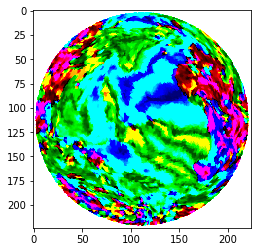

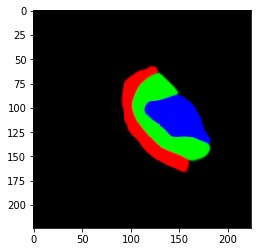

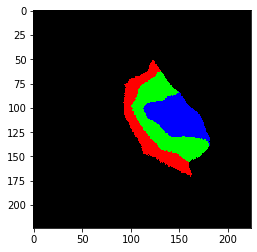

182739_lh


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


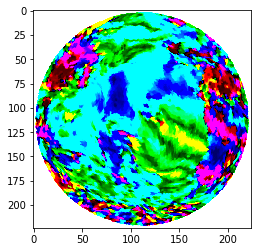

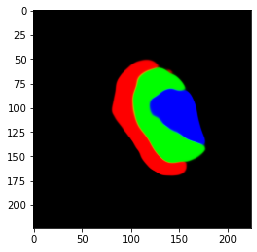

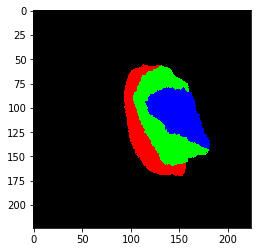

130518_lh


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


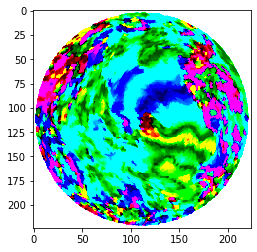

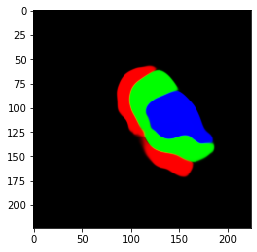

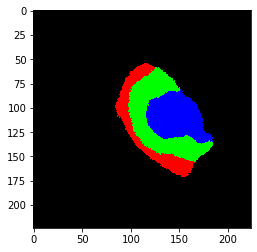

200311_rh


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


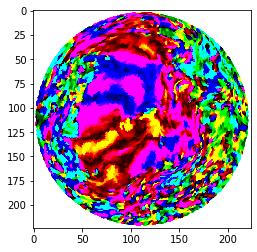

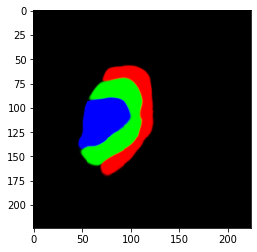

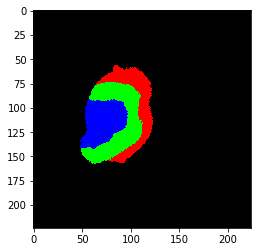

878877_lh


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


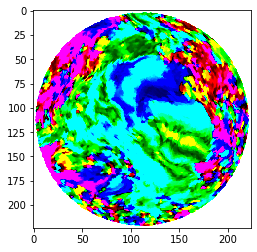

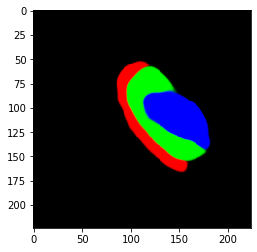

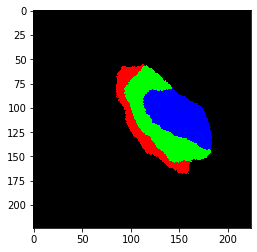

191336_lh


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


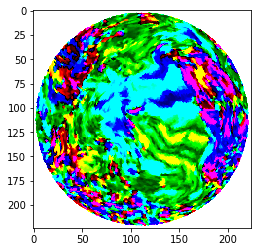

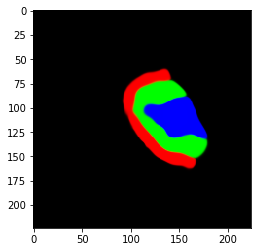

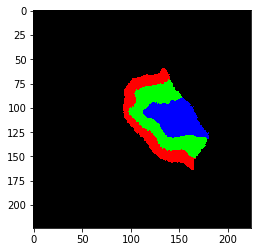

104416_rh


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


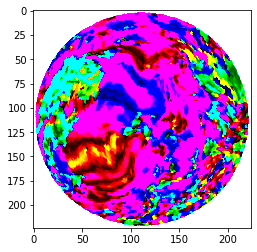

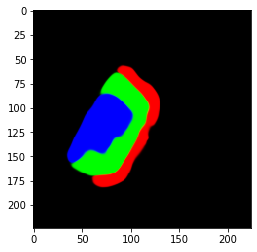

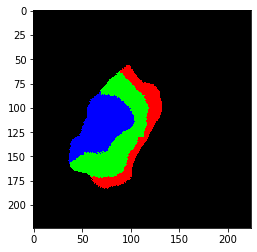

191336_rh


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


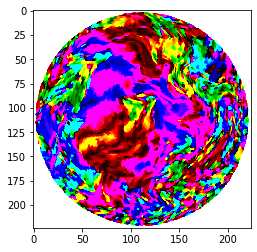

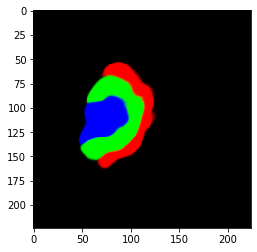

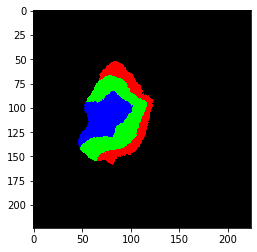

257845_rh


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


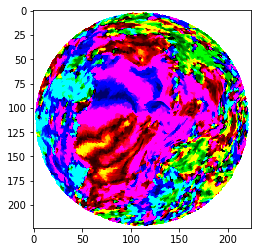

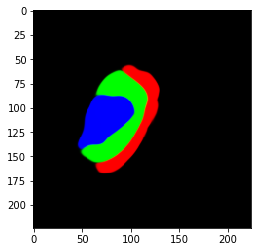

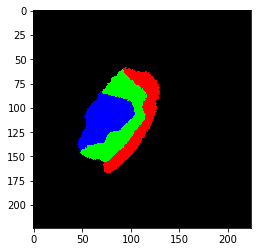

783462_rh


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


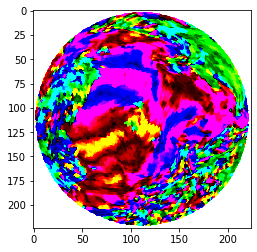

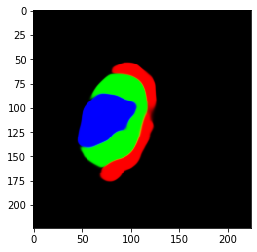

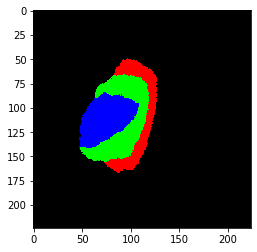

951457_lh


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


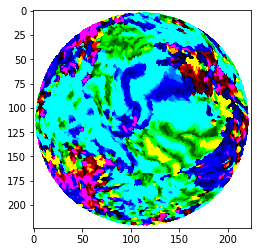

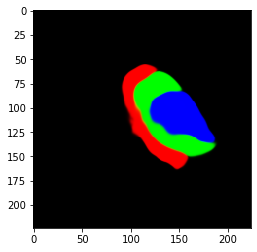

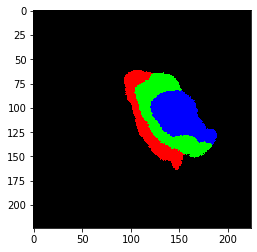

209228_lh


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


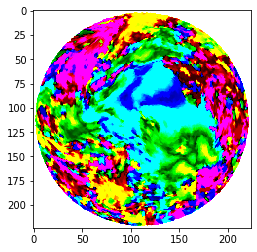

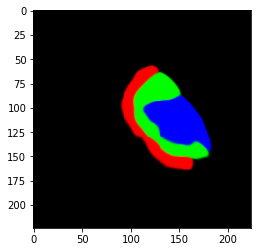

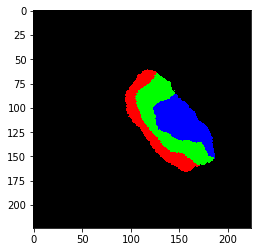

130114_lh


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


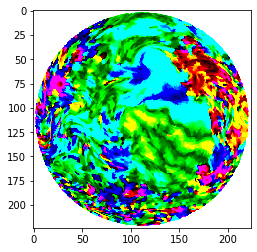

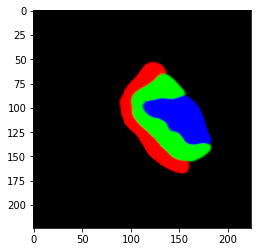

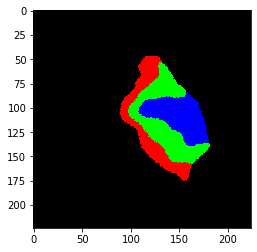

111514_rh


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


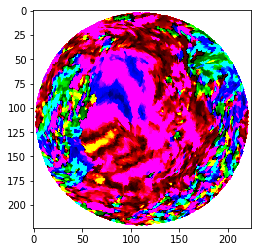

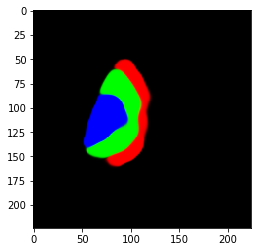

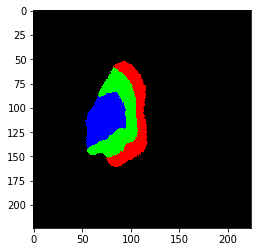

680957_lh


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


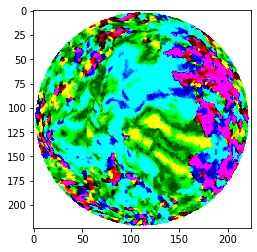

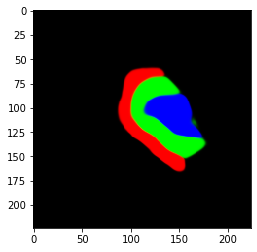

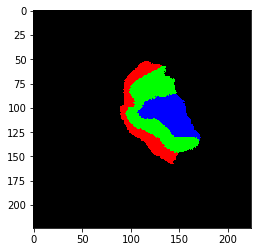

182739_rh


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


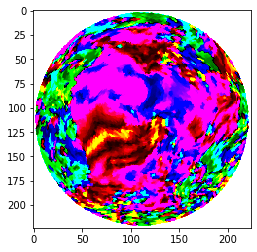

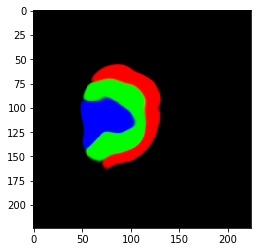

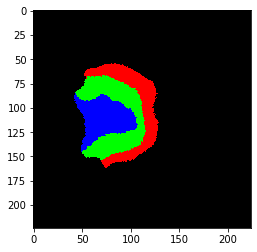

209228_rh


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


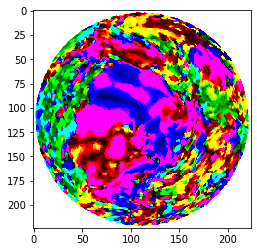

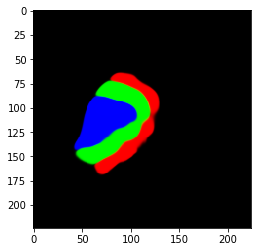

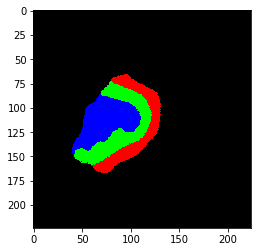

140117_lh


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


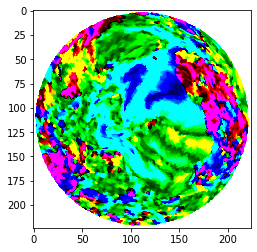

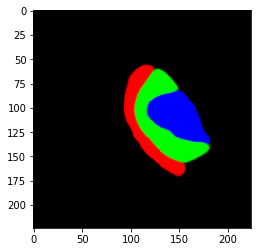

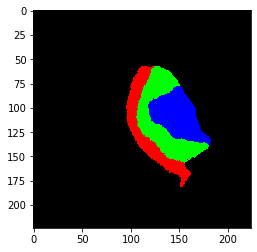

140117_rh


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


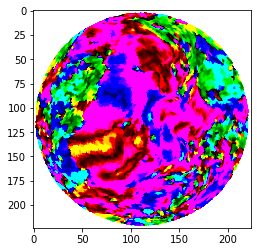

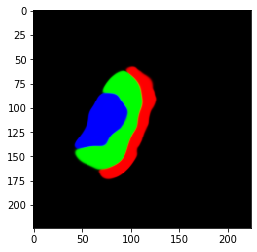

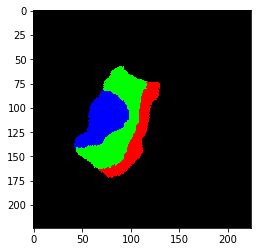

176542_rh


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


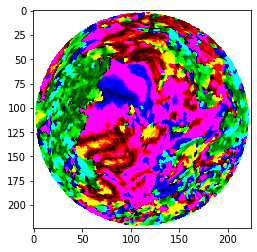

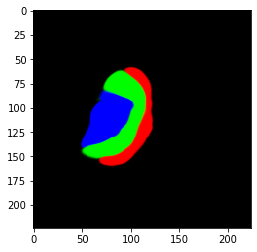

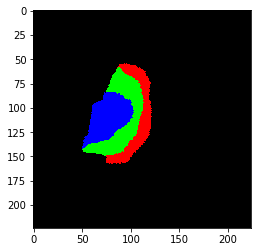

585256_rh


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


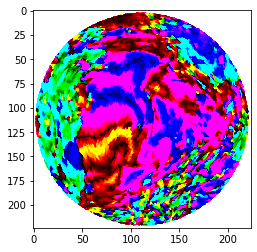

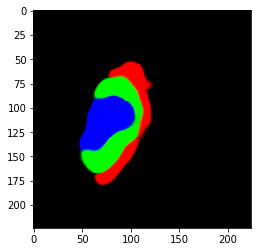

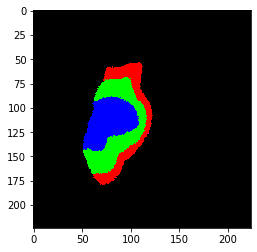

397760_lh


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


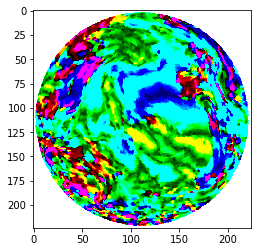

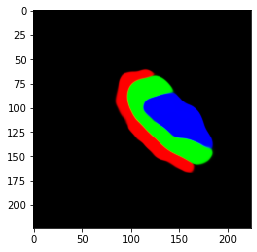

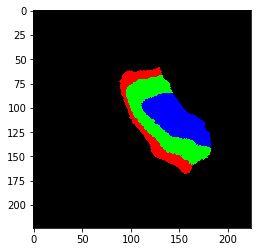

389357_rh


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


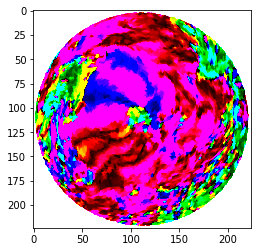

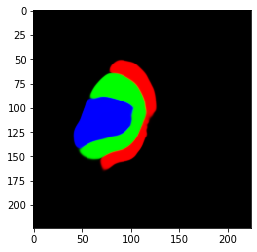

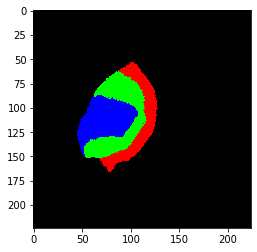

826353_rh


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


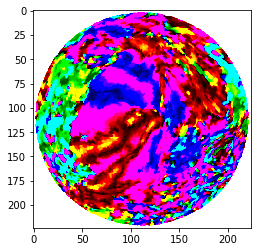

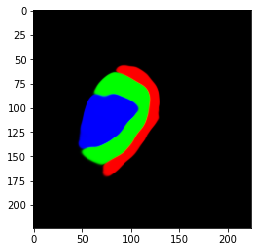

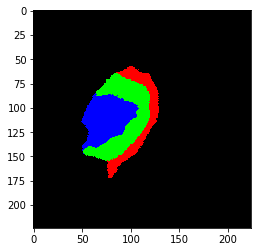

118225_rh


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


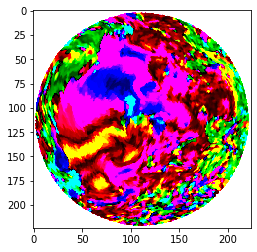

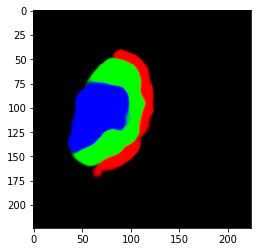

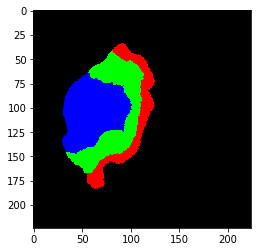

861456_lh


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


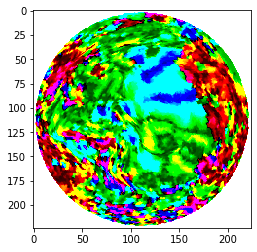

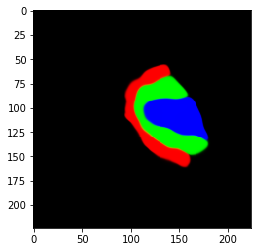

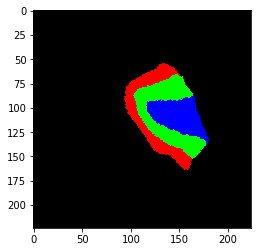

547046_rh


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


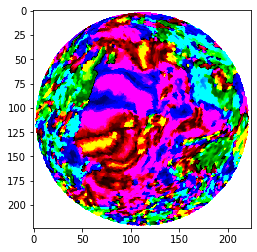

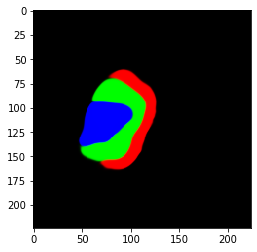

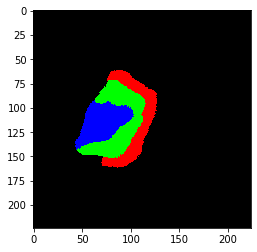

393247_lh


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


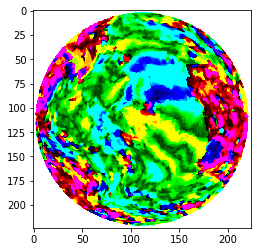

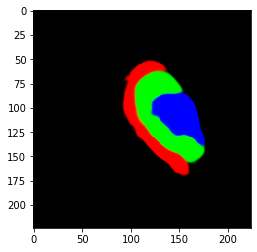

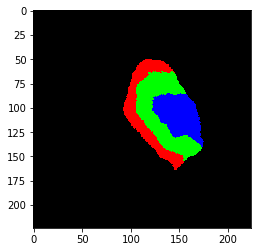

257845_lh


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


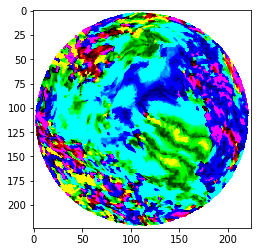

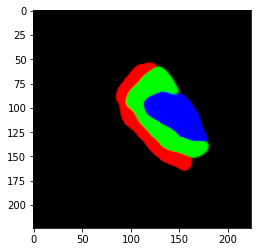

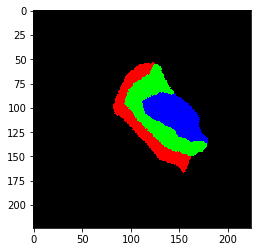

547046_lh


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


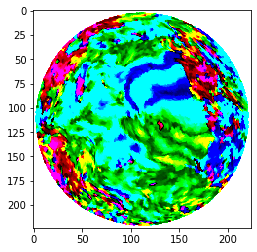

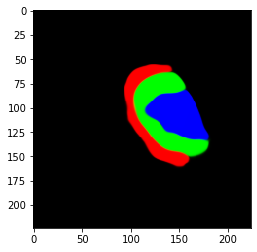

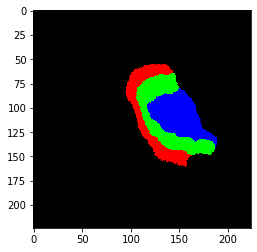

167440_rh


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


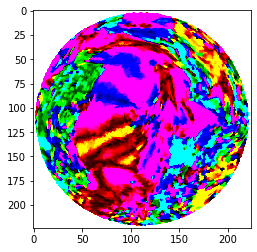

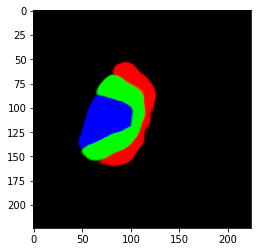

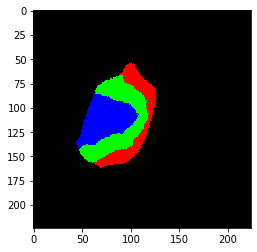

134829_rh


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


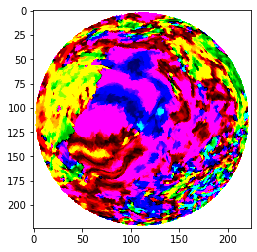

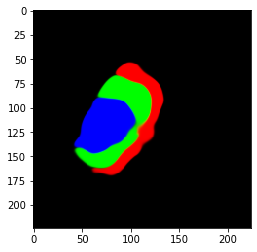

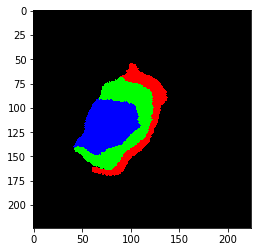

111312_lh


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


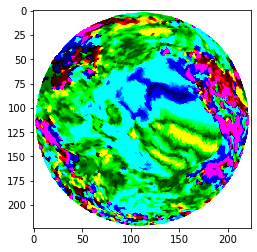

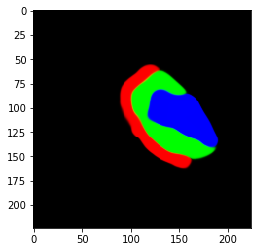

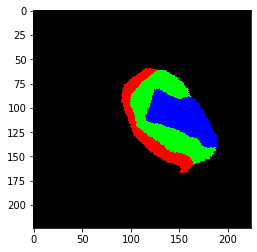

346137_lh


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


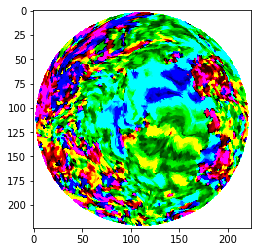

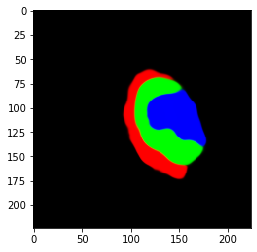

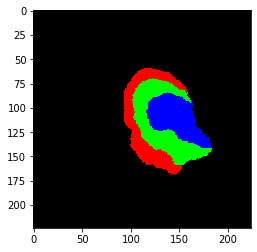

898176_rh


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


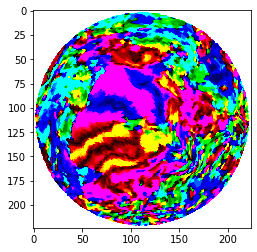

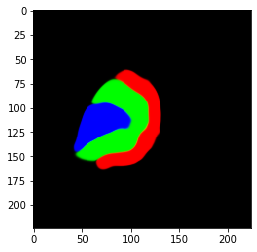

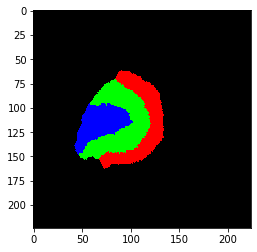

164131_lh


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


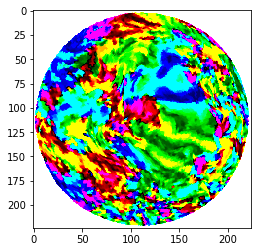

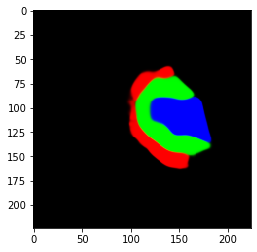

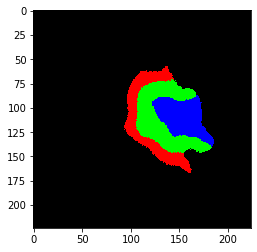

172130_rh


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


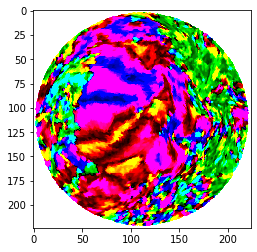

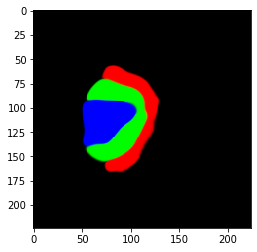

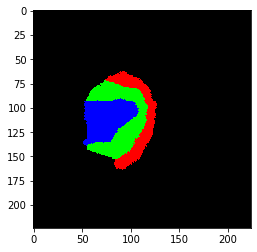

552241_lh


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


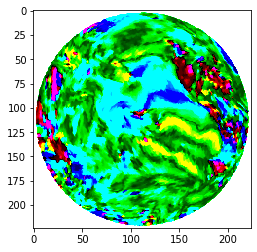

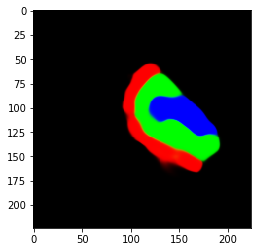

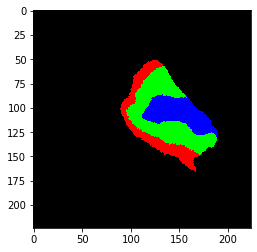

130114_rh


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


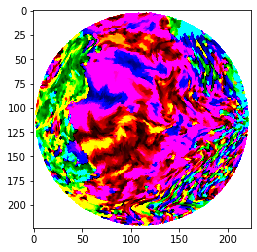

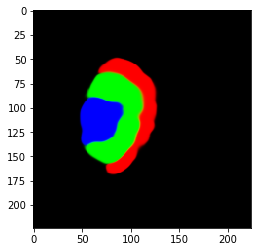

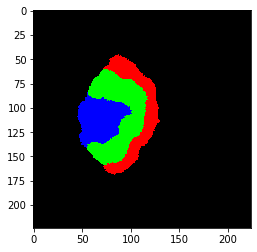

159239_rh


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


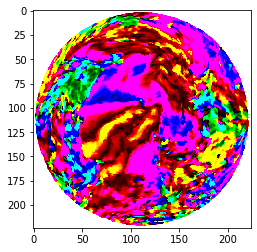

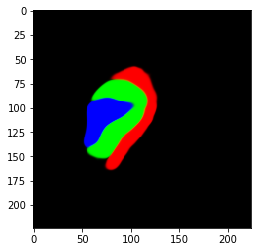

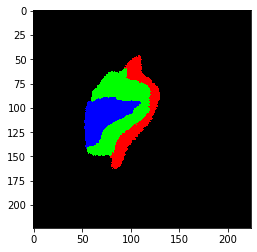

158035_rh


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


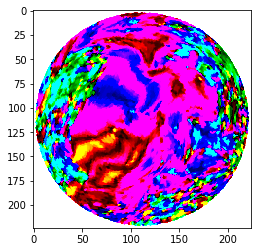

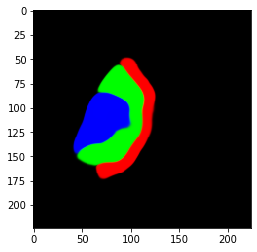

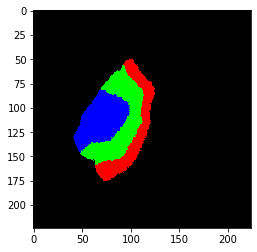

926862_lh


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


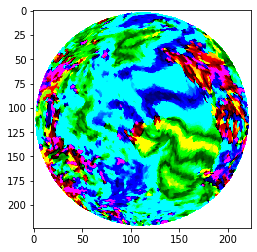

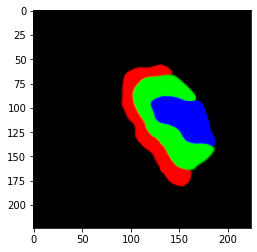

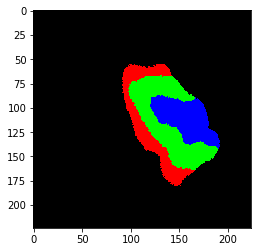

116726_rh


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


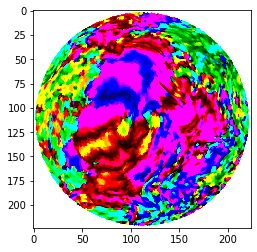

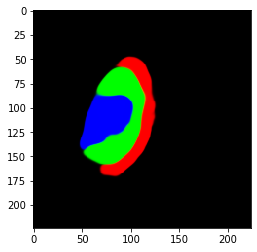

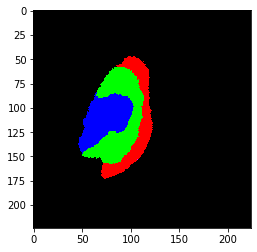

899885_lh


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


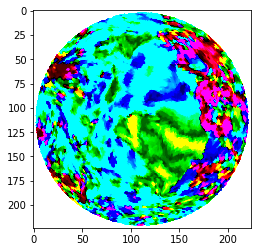

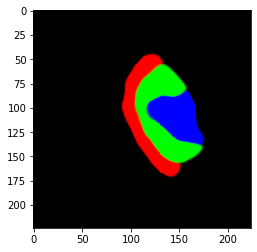

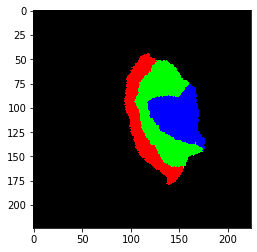

346137_rh


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


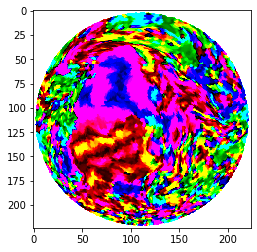

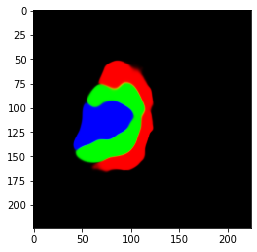

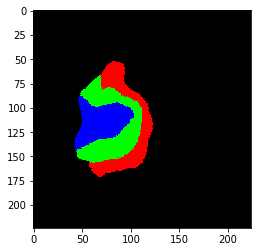

157336_rh


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


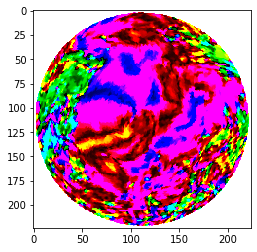

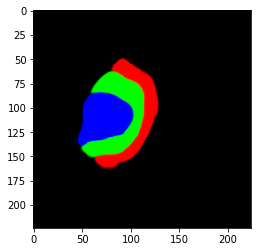

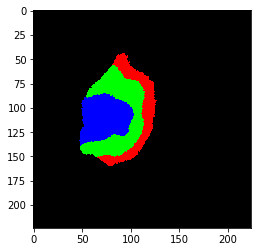

131217_rh


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


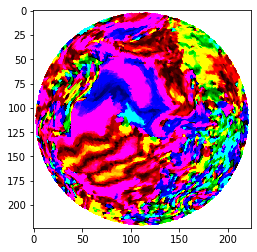

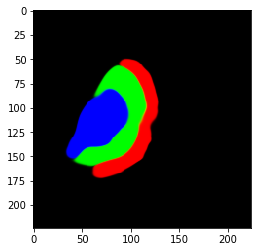

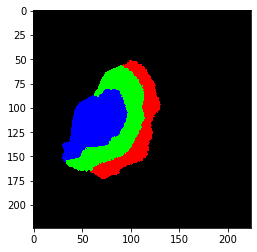

111514_lh


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


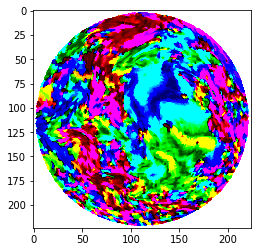

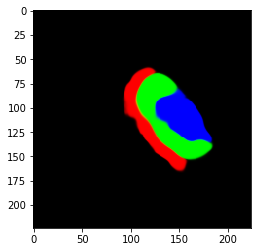

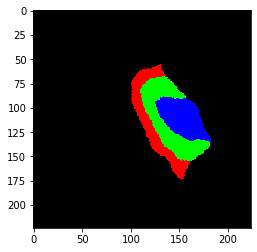

177140_rh


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


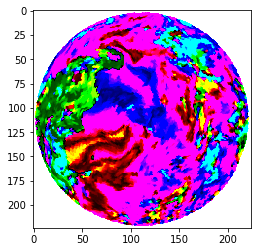

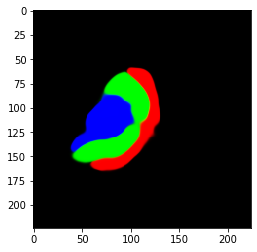

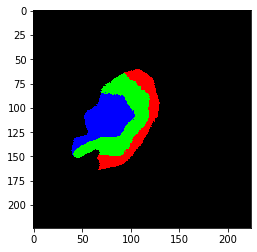

878877_rh


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


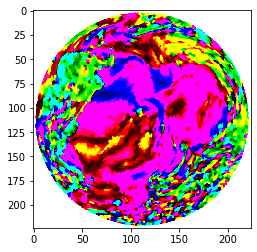

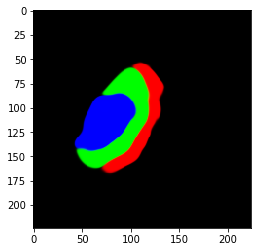

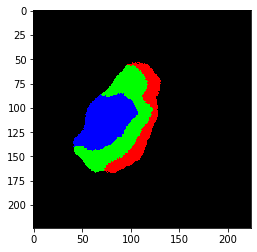

393247_rh


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


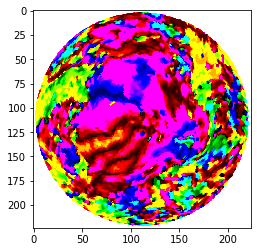

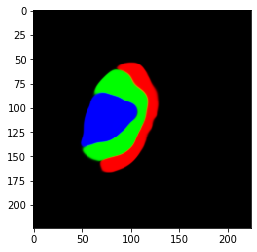

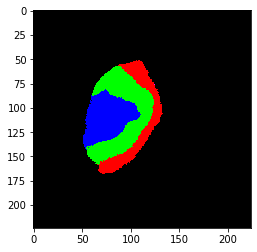

861456_rh


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


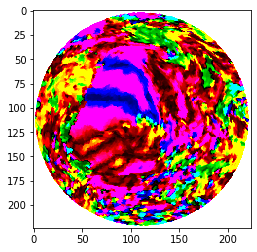

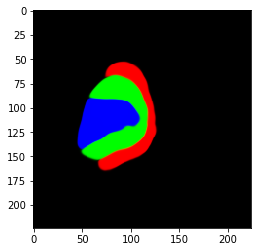

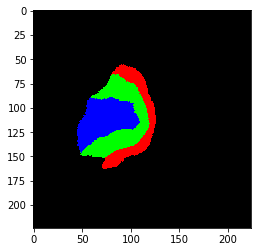

770352_rh


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


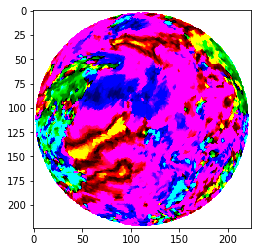

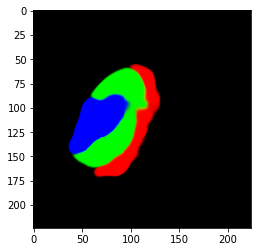

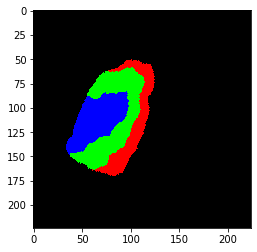

128935_rh


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


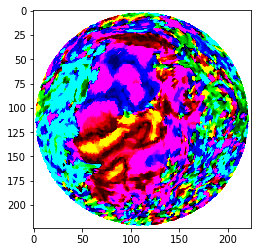

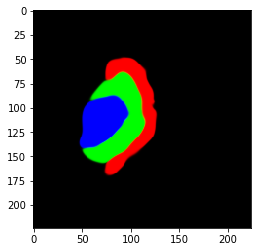

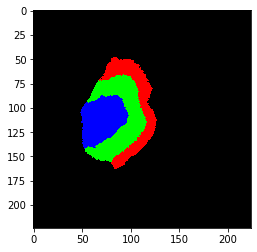

898176_lh


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


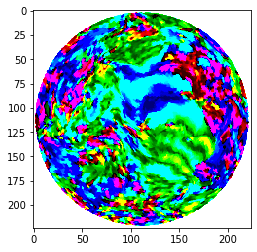

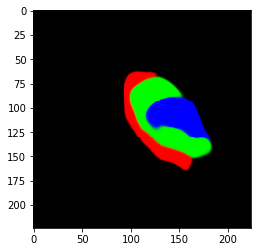

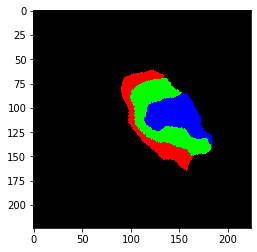

966975_lh


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


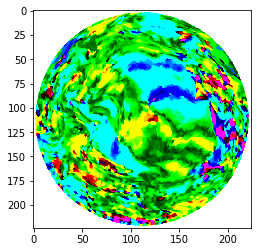

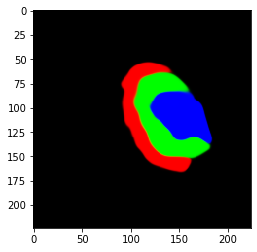

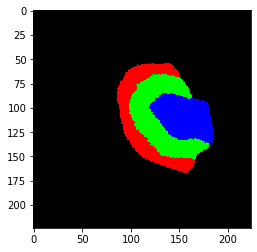

148133_rh


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


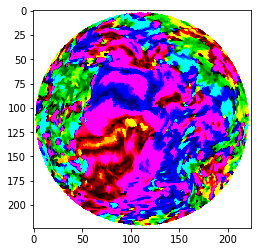

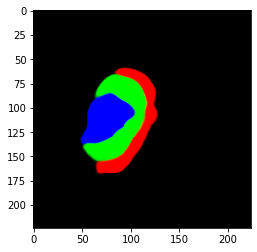

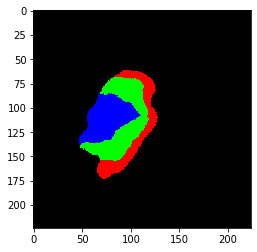

111312_rh


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


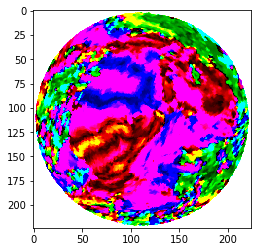

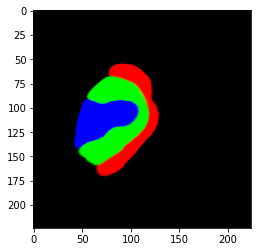

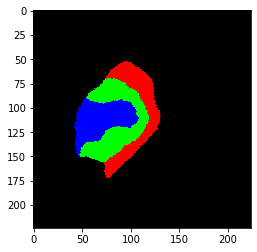

180533_lh


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


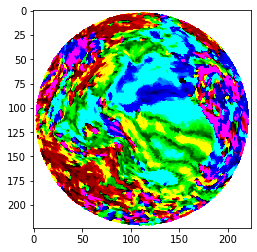

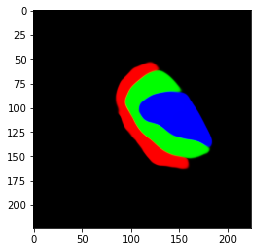

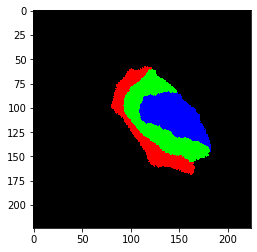

203418_rh


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


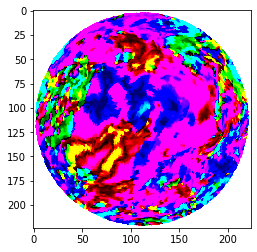

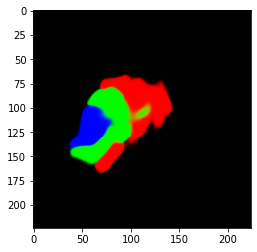

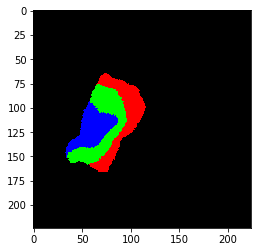

150423_rh


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


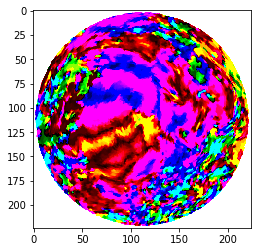

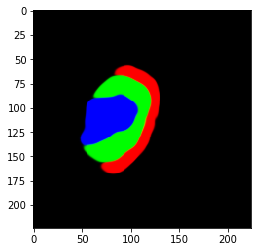

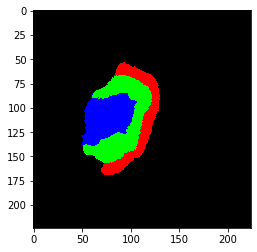

157336_lh


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


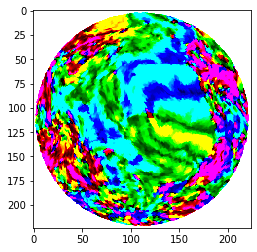

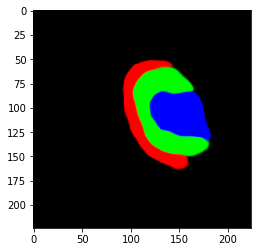

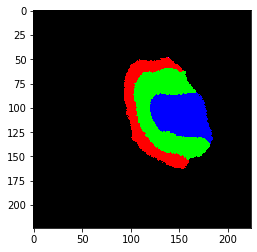

104416_lh


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


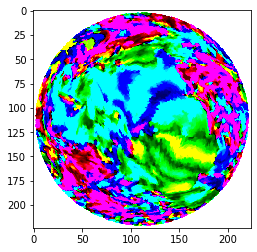

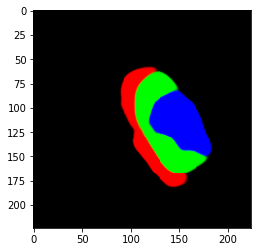

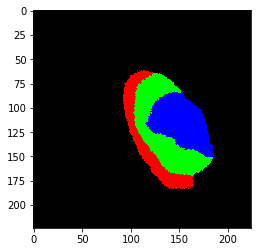

115825_lh


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


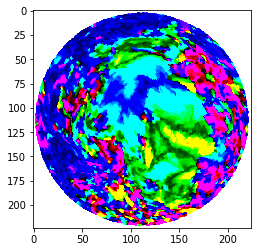

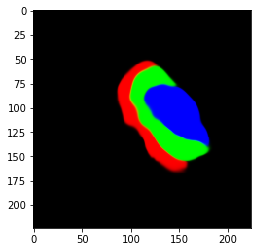

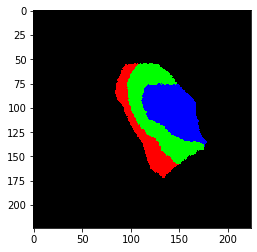

783462_lh


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


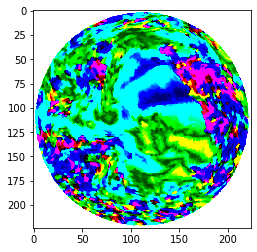

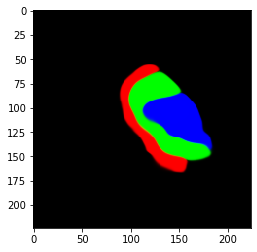

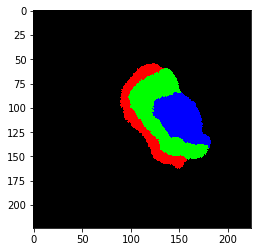

134627_lh


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


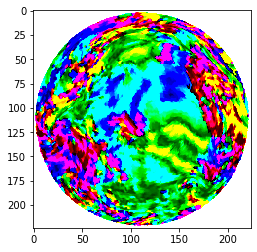

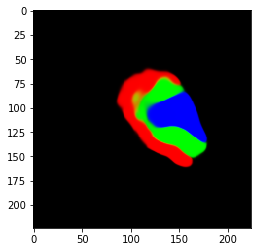

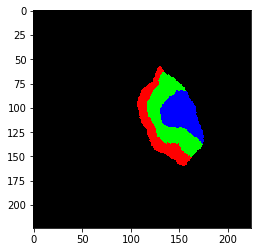

115017_lh


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


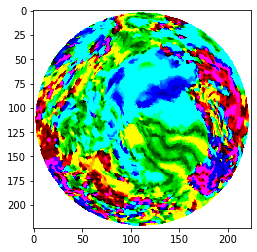

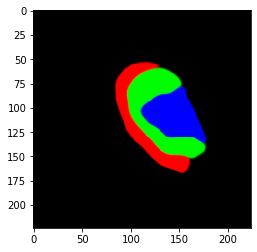

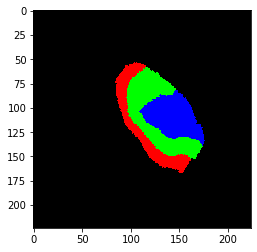

617748_lh


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


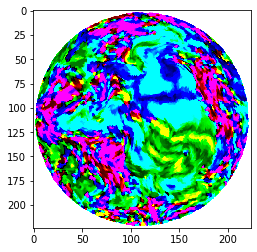

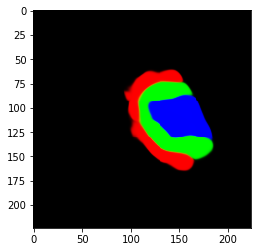

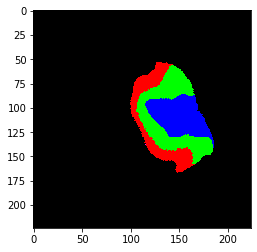

585256_lh


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


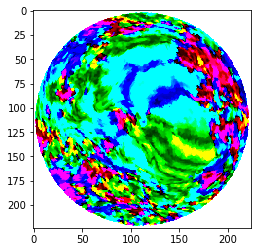

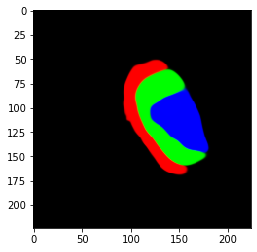

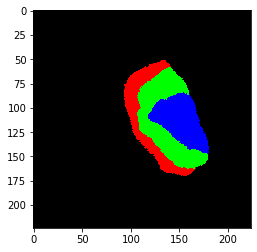

871762_lh


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


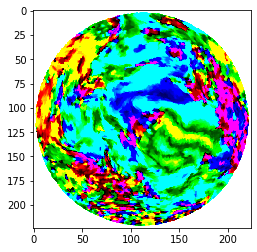

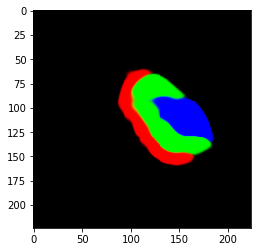

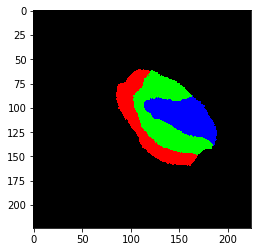

966975_rh


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


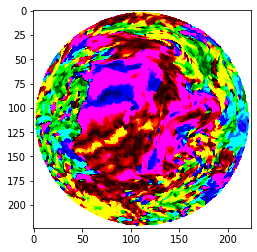

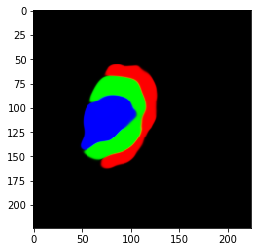

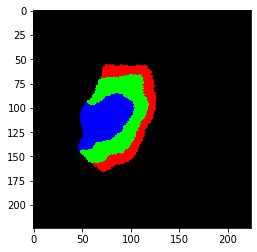

116726_lh


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


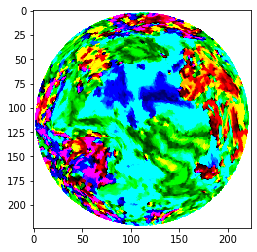

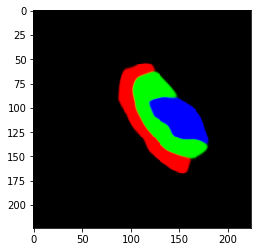

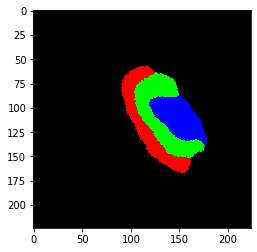

389357_lh


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


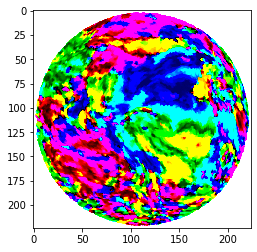

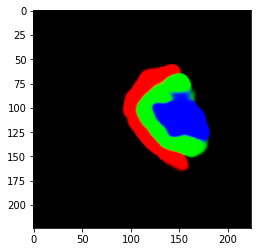

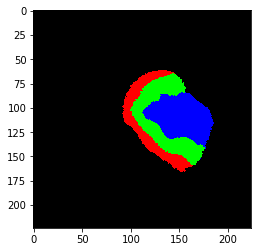

109123_lh


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


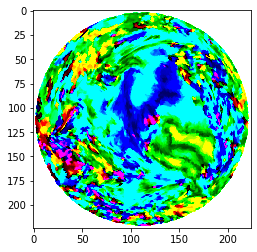

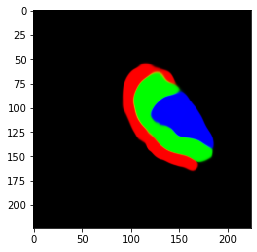

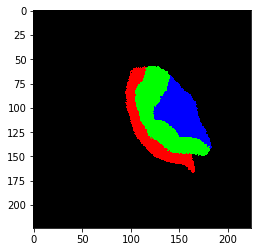

172130_lh


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


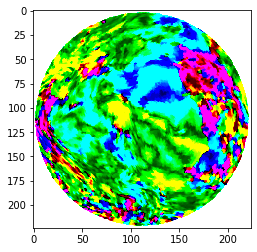

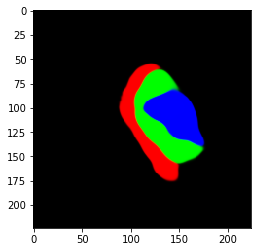

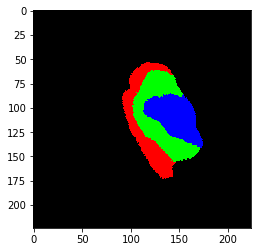

249947_rh


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


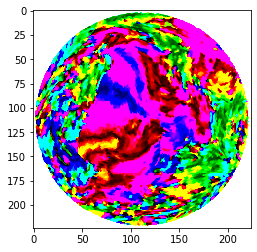

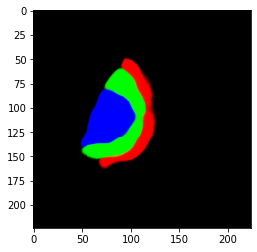

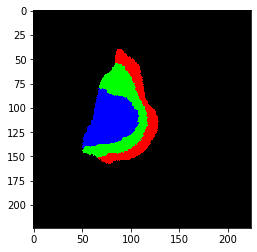

128935_lh


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


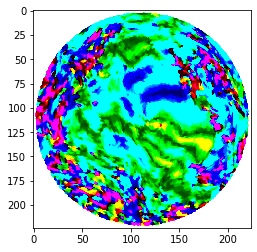

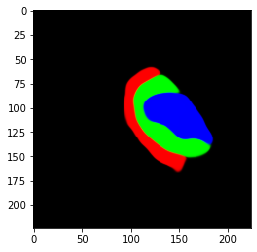

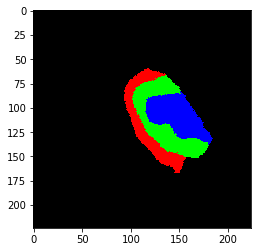

401422_lh


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


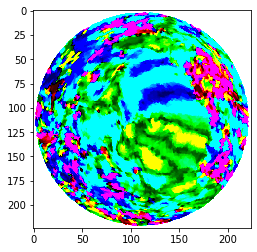

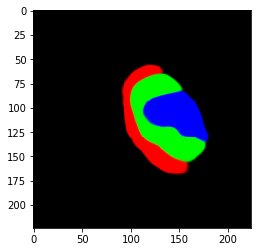

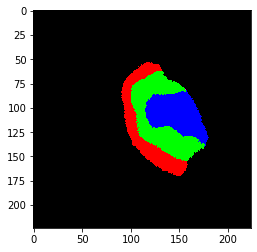

552241_rh


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


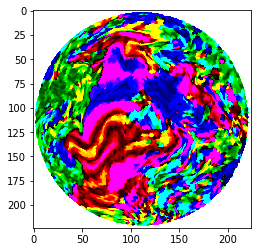

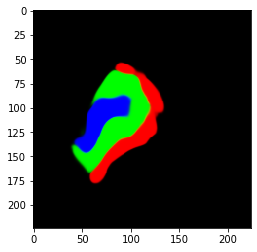

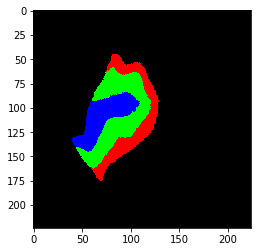

263436_lh


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


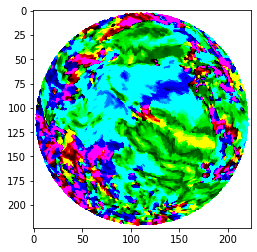

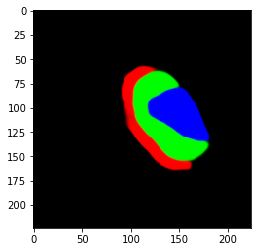

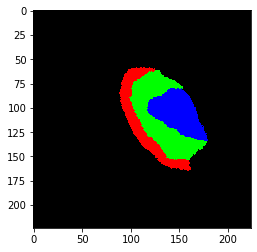

214524_lh


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


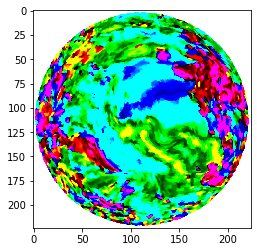

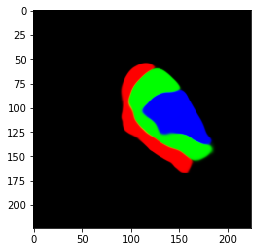

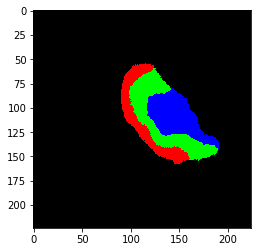

167440_lh


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


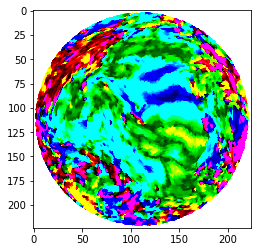

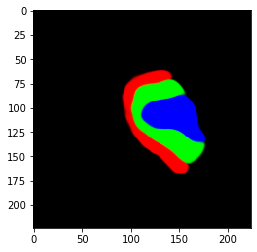

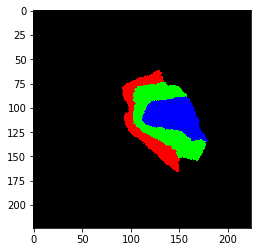

251833_lh


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


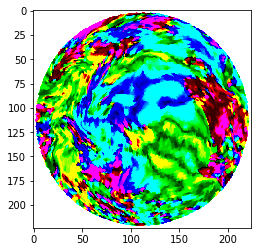

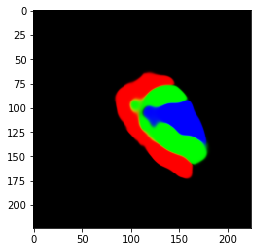

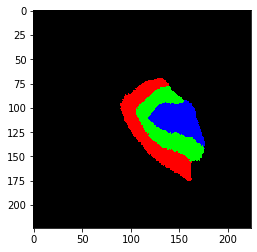

164636_rh


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


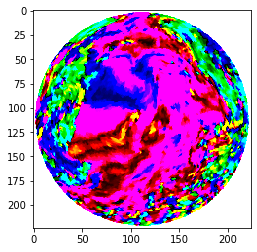

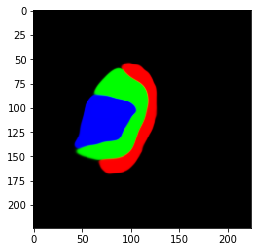

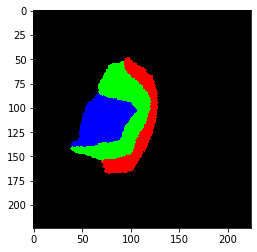

680957_rh


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


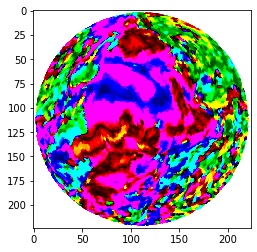

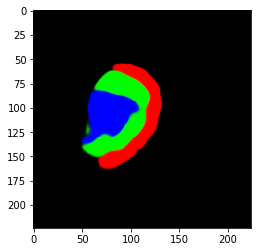

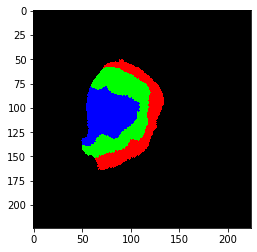

180533_rh


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


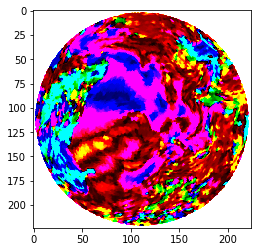

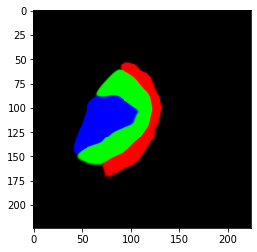

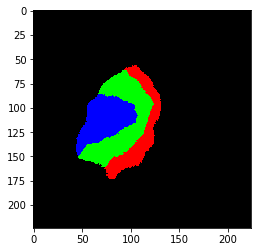

100610_lh


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


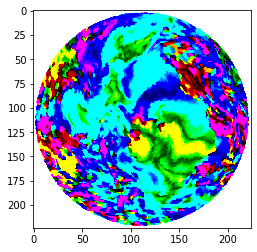

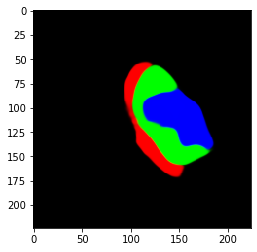

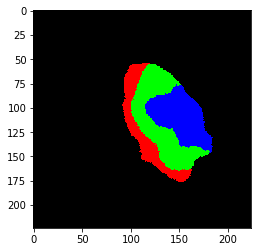

249947_lh


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


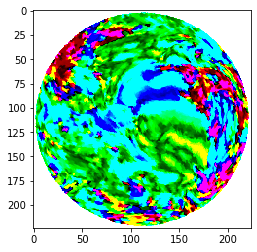

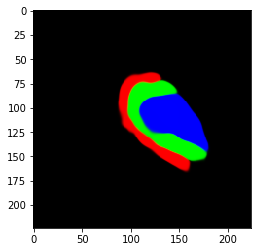

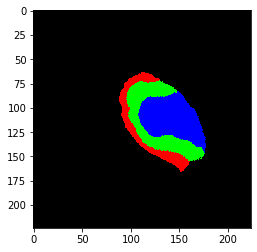

203418_lh


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


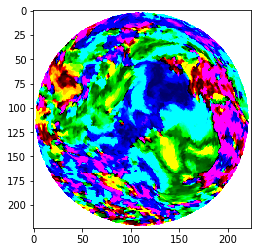

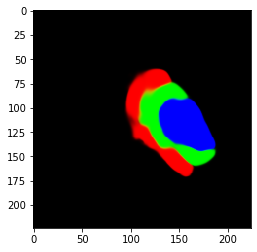

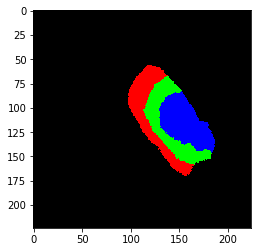

782561_lh


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


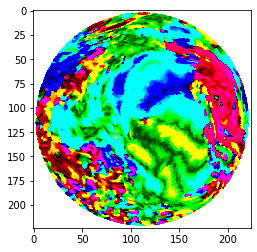

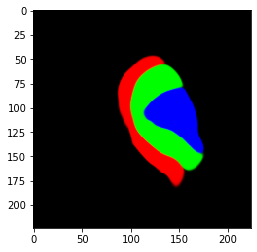

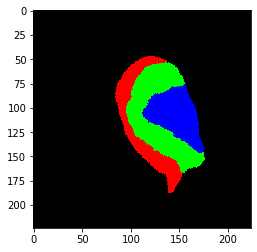

131722_lh


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


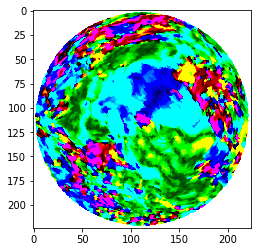

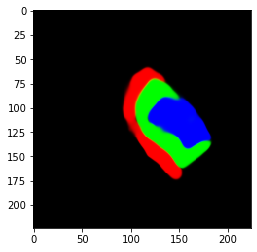

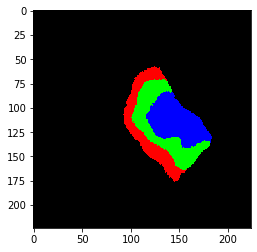

148133_lh


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


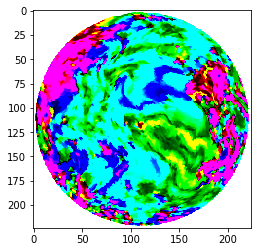

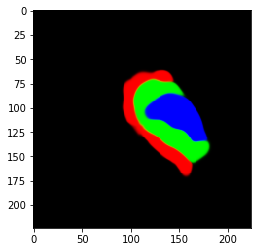

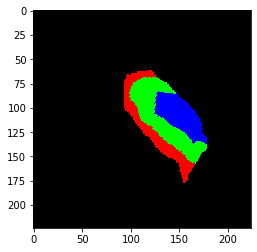

192641_rh


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


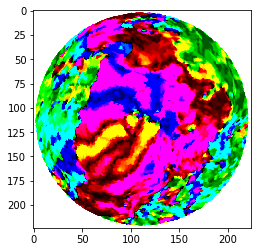

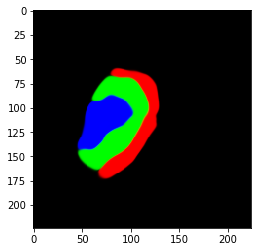

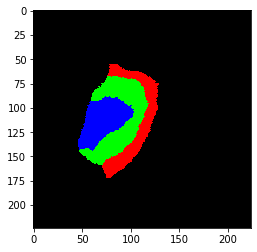

320826_lh


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


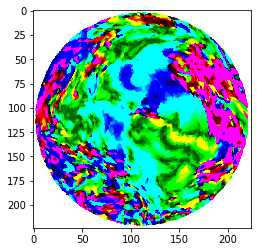

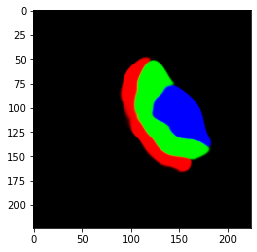

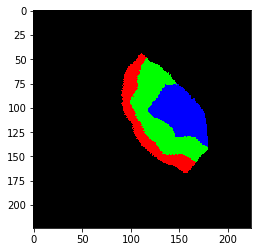

105923_lh


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


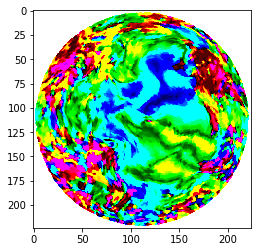

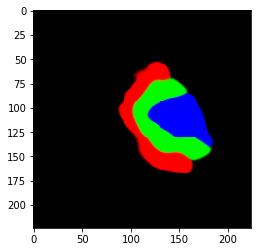

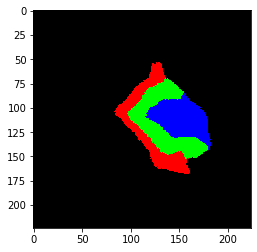

926862_rh


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


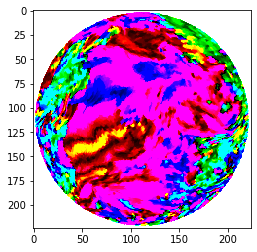

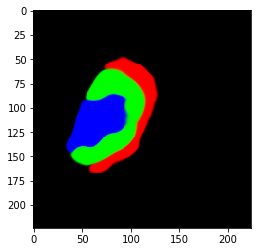

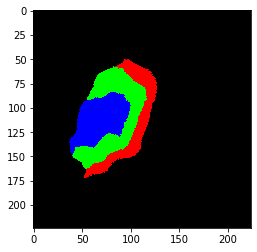

467351_rh


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


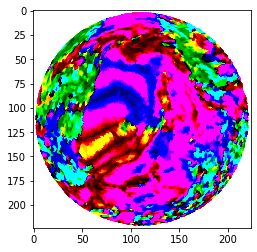

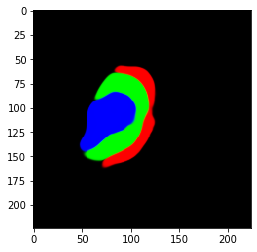

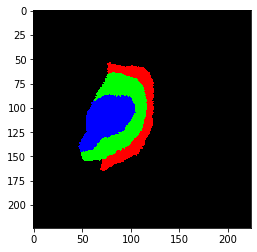

130518_rh


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


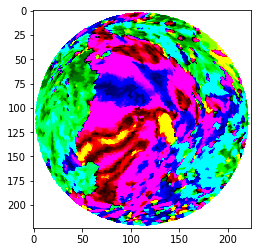

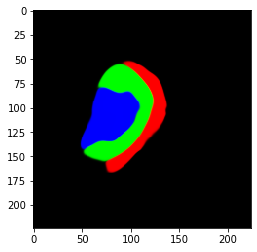

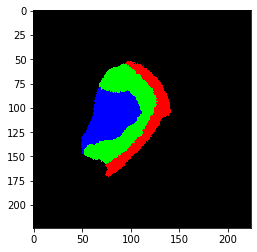

397760_rh


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


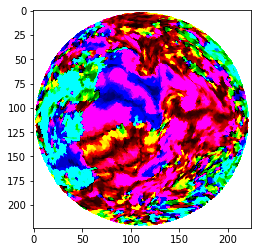

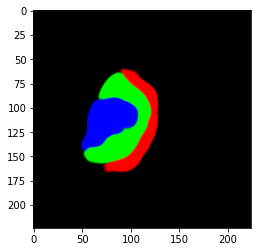

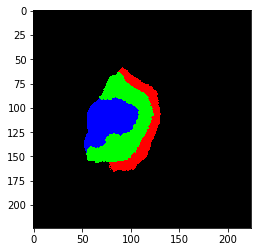

109123_rh


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


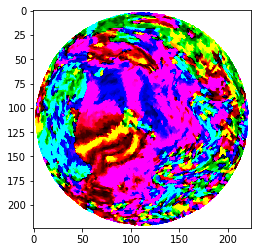

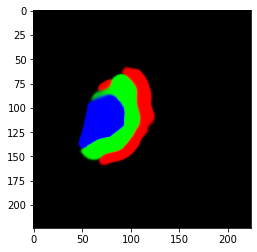

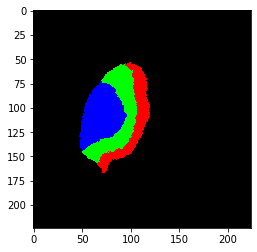

263436_rh


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


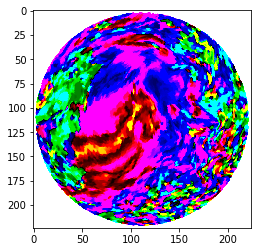

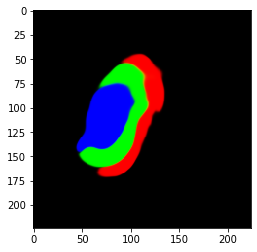

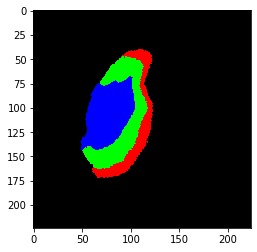

115017_rh


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


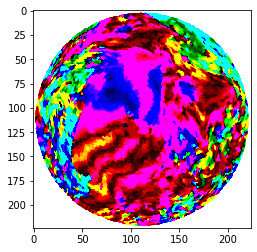

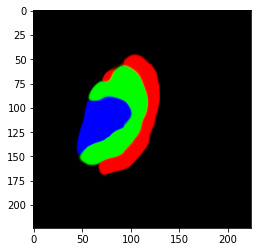

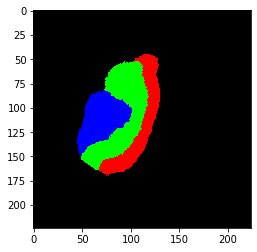

246133_lh


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


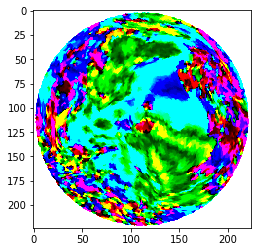

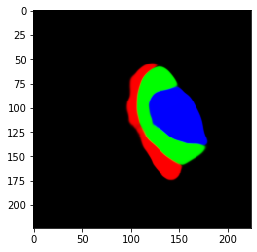

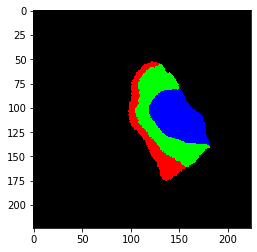

126426_rh


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


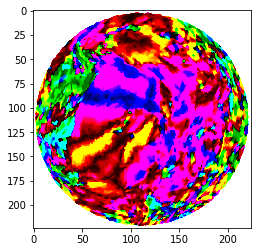

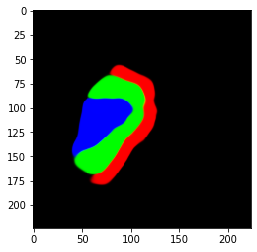

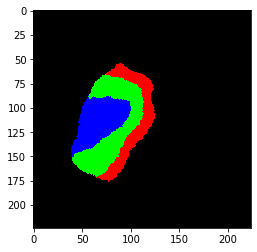

214524_rh


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


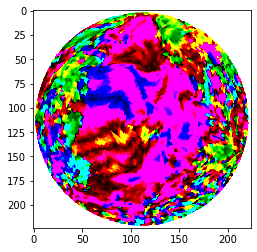

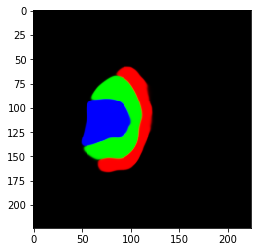

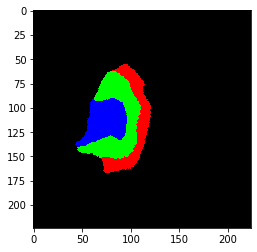

177140_lh


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


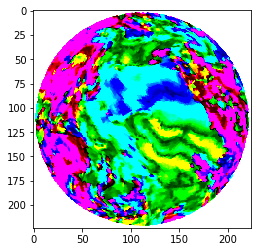

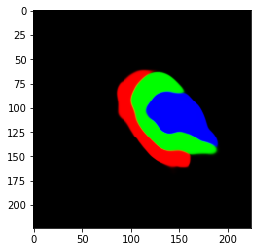

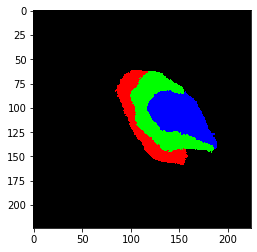

171633_rh


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


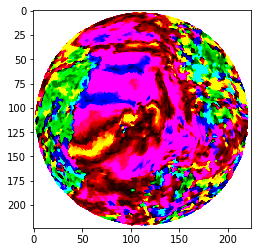

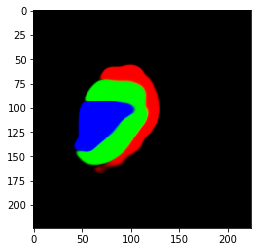

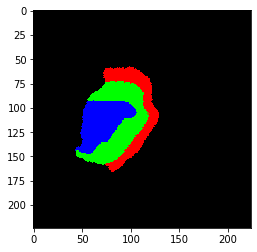

159239_lh


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


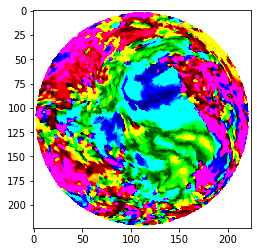

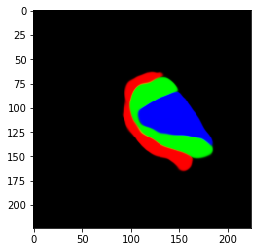

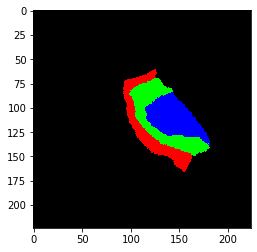

167036_rh


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


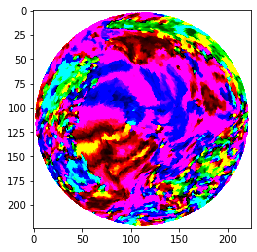

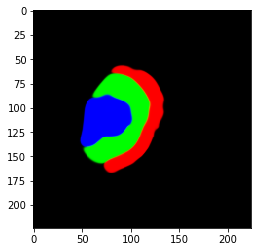

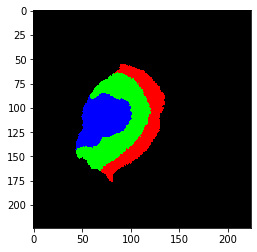

126426_lh


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


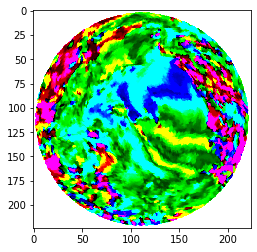

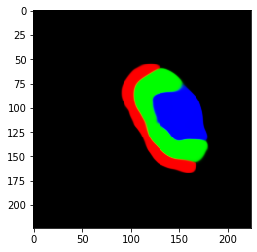

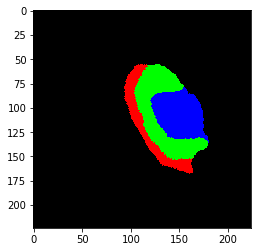

146129_rh


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


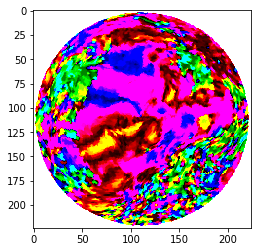

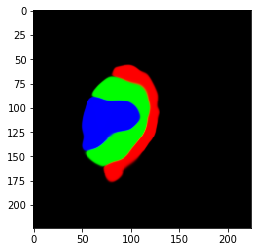

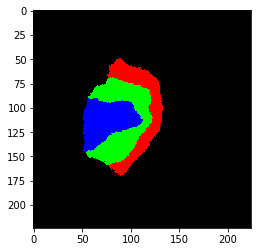

146129_lh


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


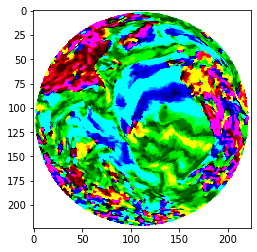

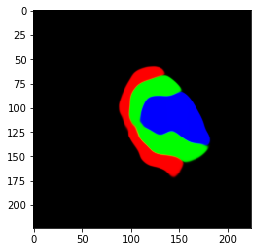

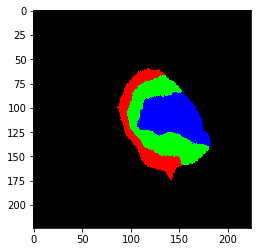

134829_lh


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


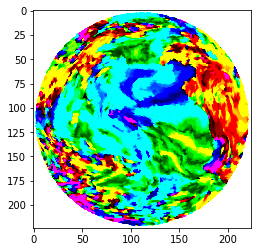

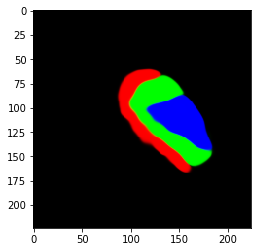

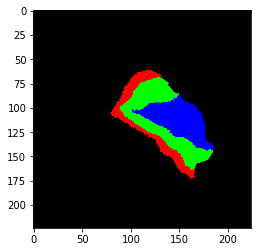

283543_lh


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


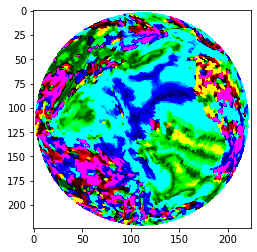

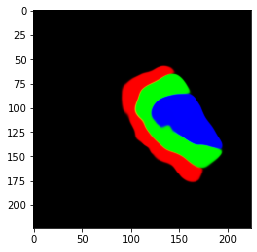

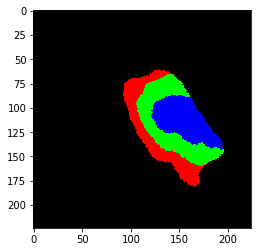

770352_lh


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


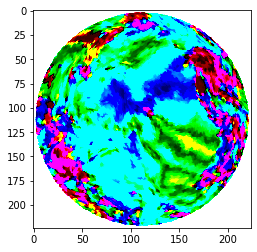

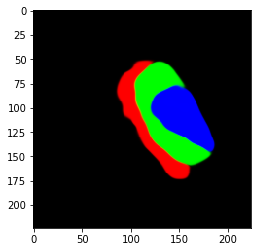

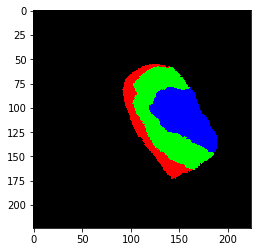

200311_lh


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


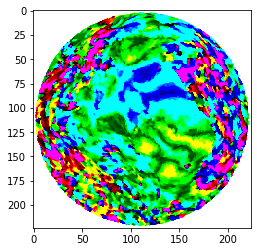

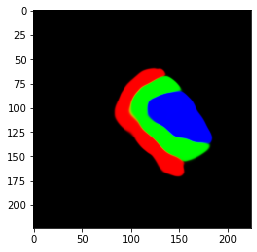

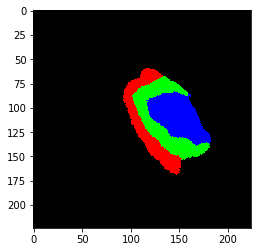

617748_rh


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


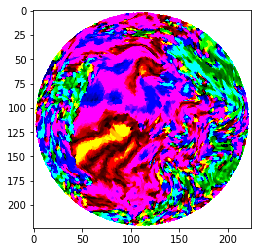

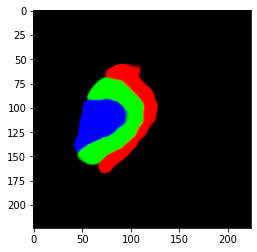

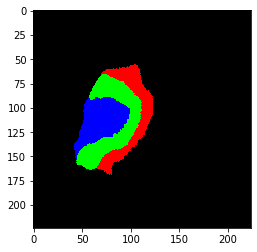

167036_lh


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


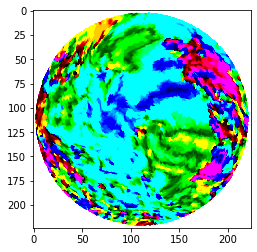

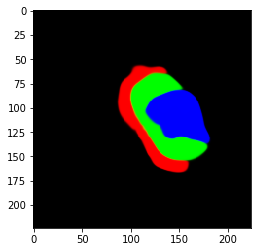

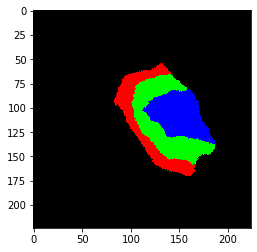

176542_lh


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


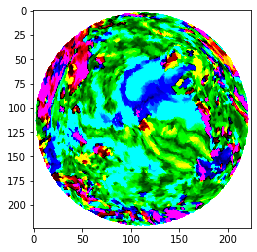

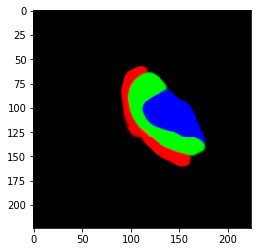

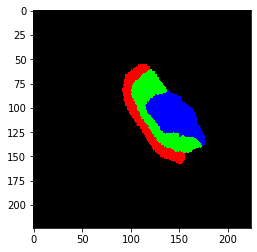

320826_rh


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


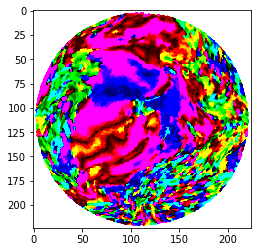

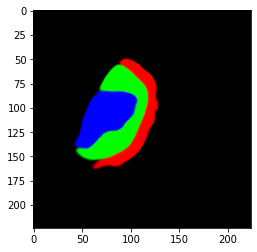

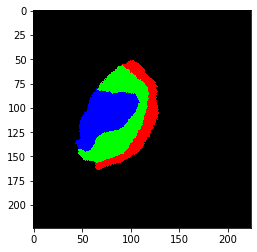

826353_lh


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


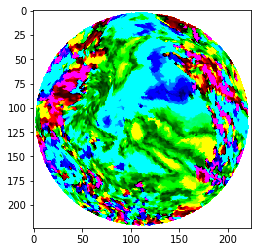

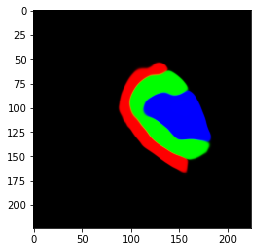

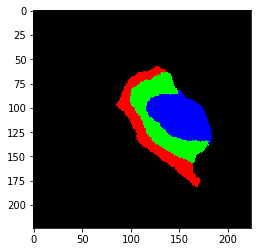

899885_rh


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


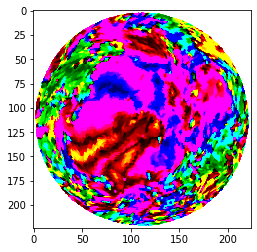

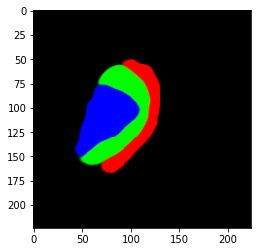

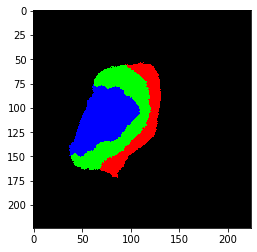

164131_rh


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


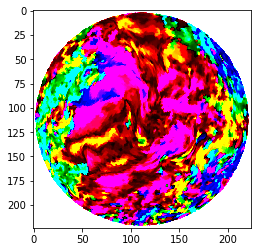

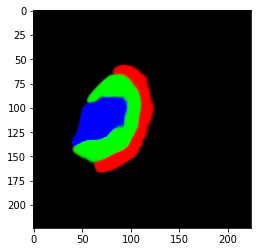

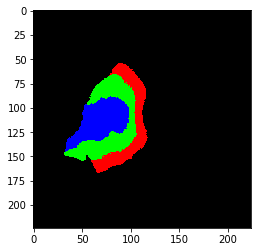

131722_rh


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


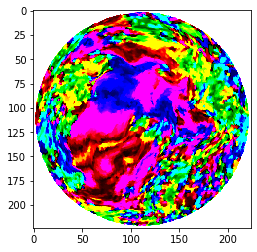

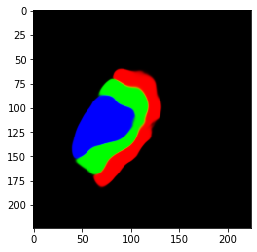

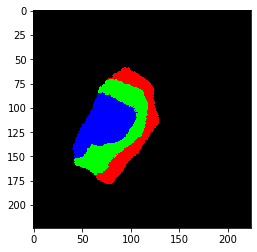

108323_rh


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


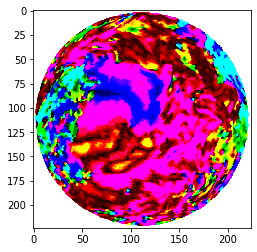

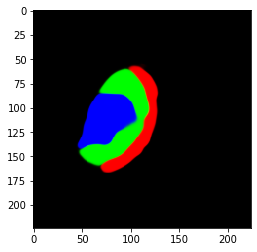

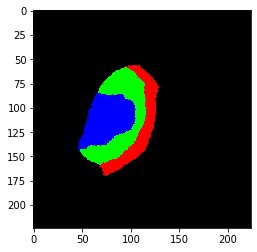

191841_lh


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


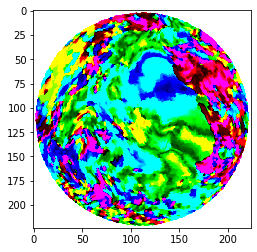

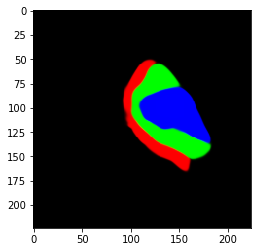

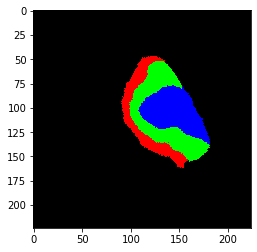

105923_rh


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


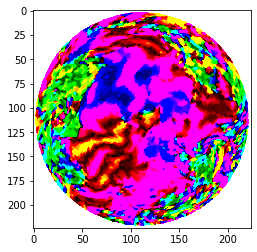

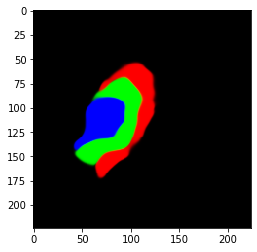

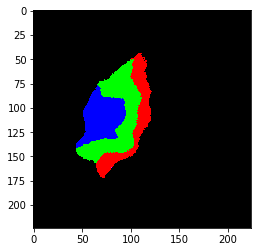

581450_lh


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


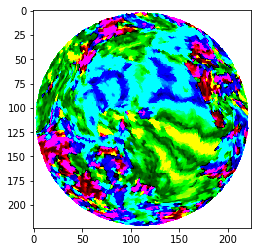

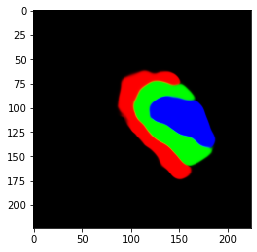

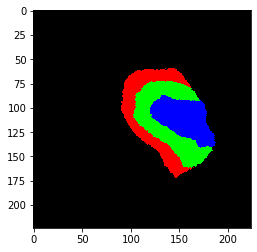

951457_rh


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


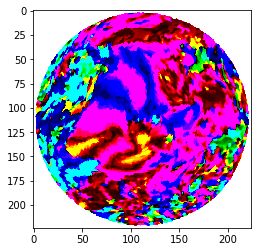

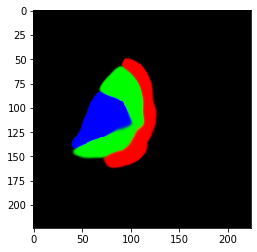

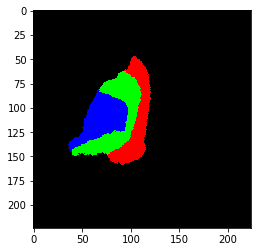

165436_lh


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


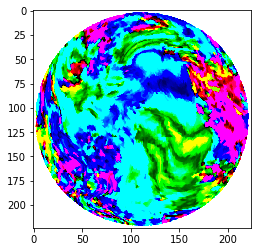

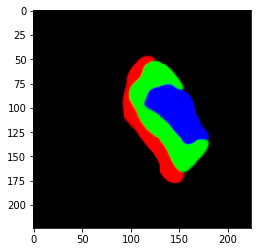

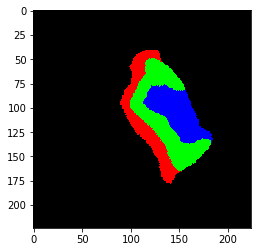

134627_rh


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


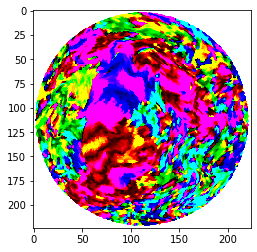

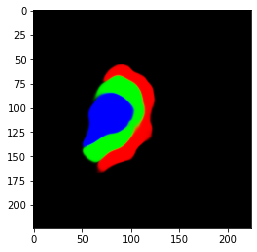

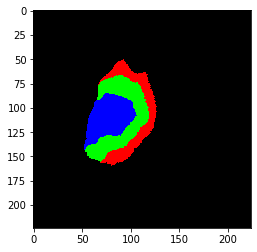

789373_rh


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


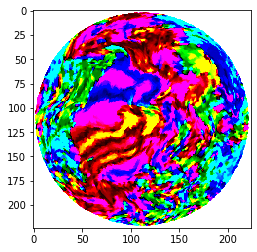

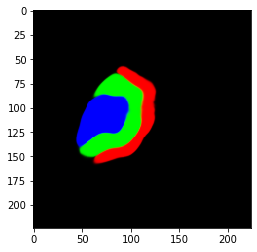

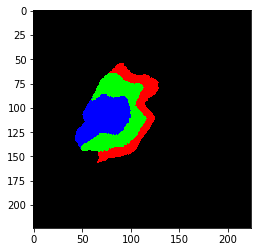

115825_rh


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


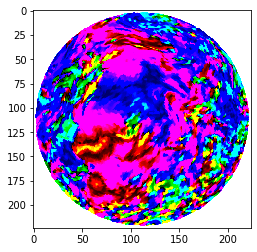

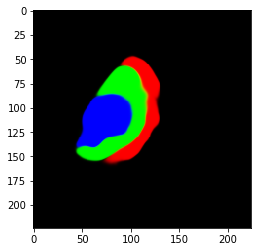

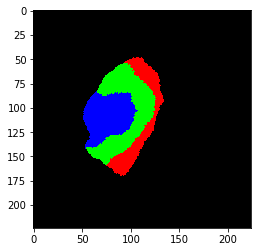

118225_lh


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


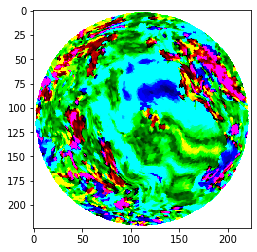

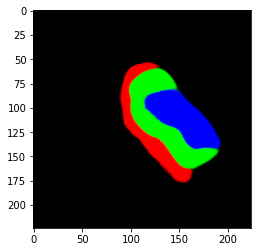

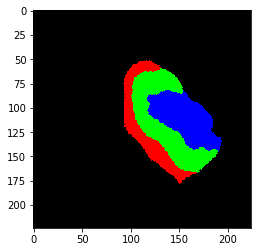

108323_lh


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


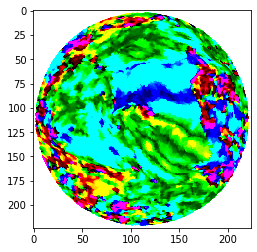

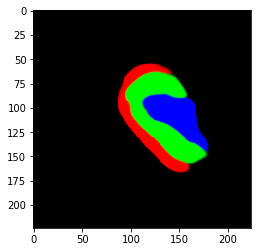

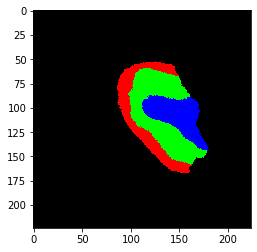

221319_lh


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


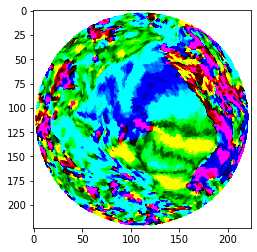

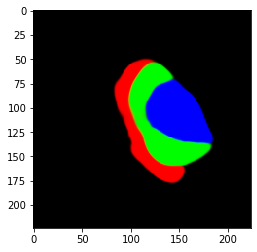

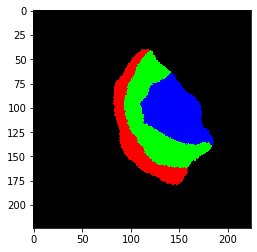

246133_rh


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


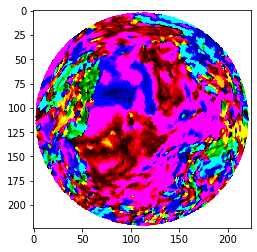

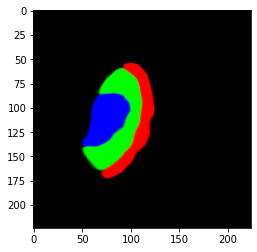

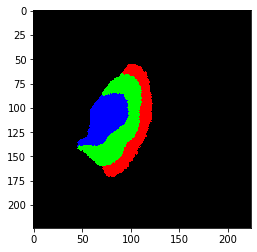

818859_rh


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


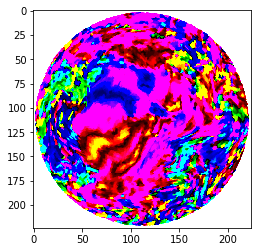

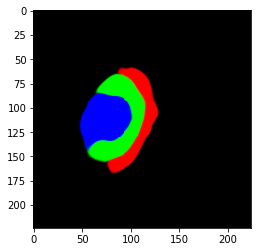

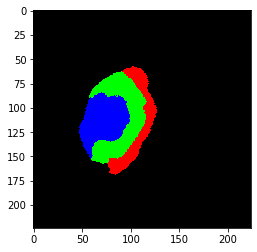

150423_lh


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


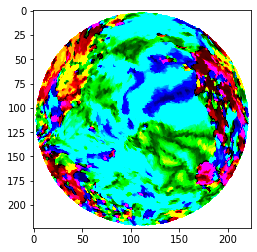

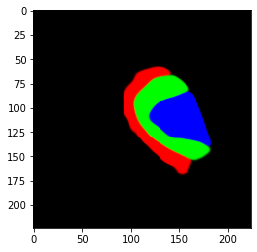

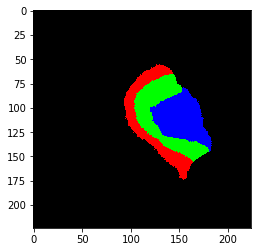

782561_rh


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


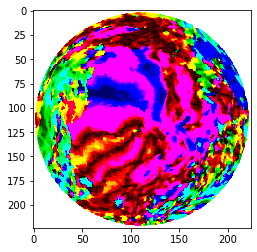

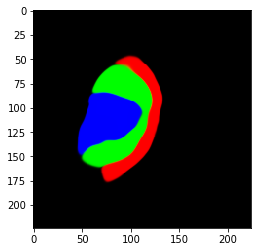

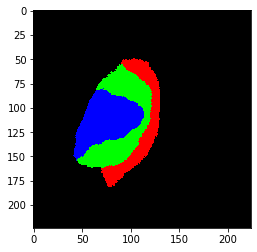

818859_lh


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


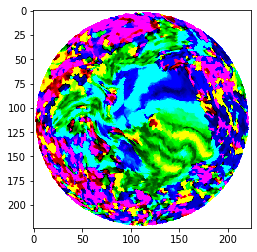

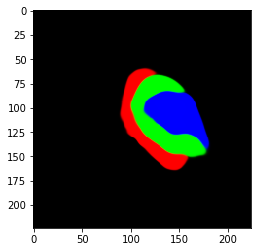

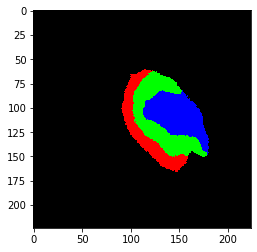

171633_lh


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


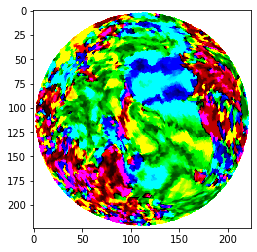

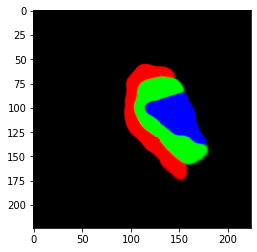

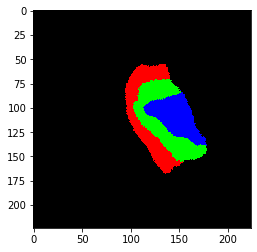

100610_rh


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


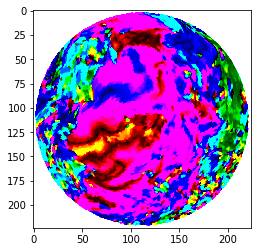

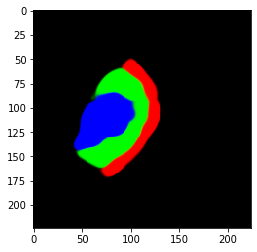

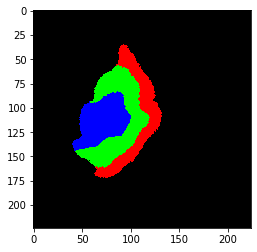

581450_rh


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


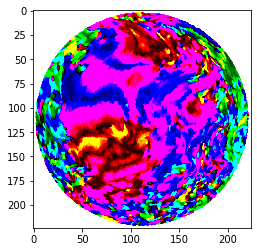

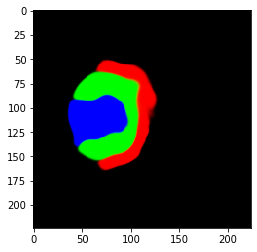

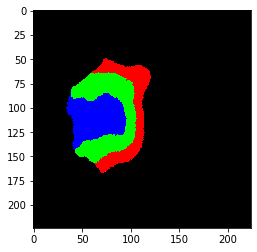

871762_rh


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


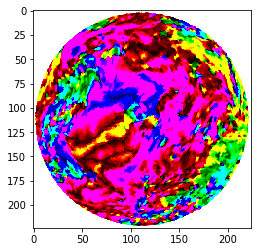

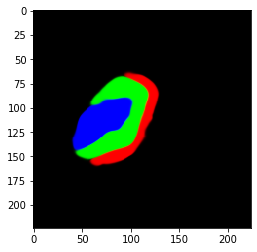

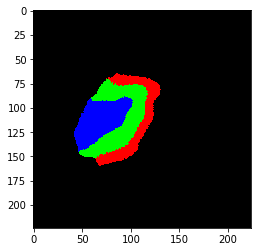

191841_rh


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


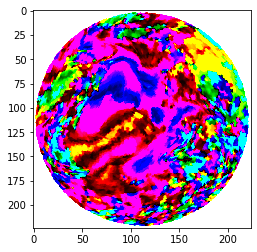

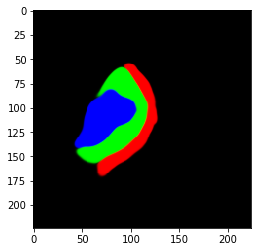

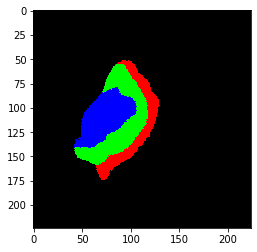

131217_lh


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


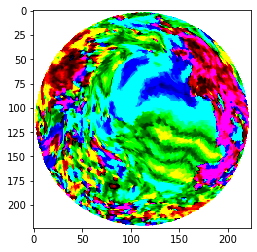

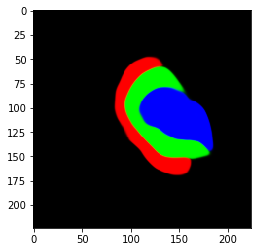

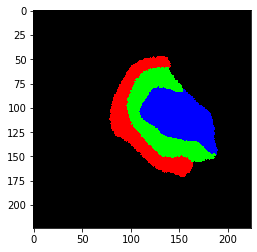

221319_rh


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


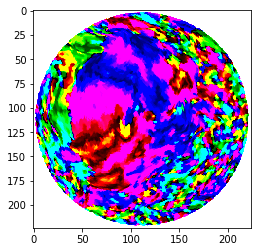

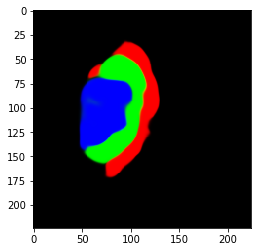

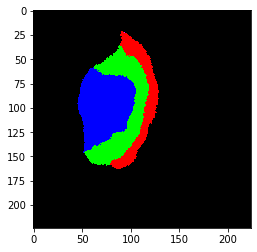

164636_lh


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


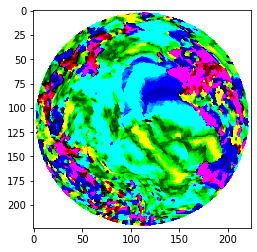

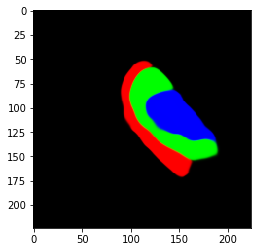

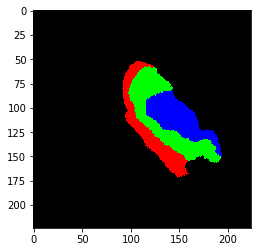

401422_rh


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


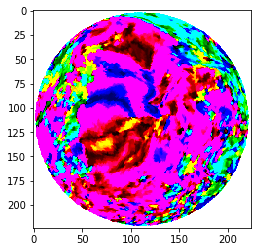

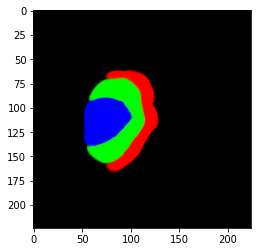

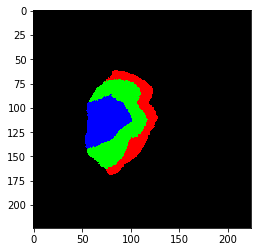

789373_lh


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


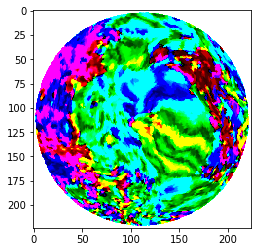

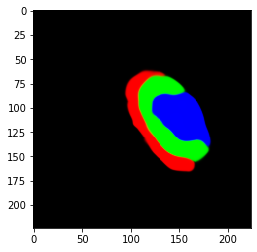

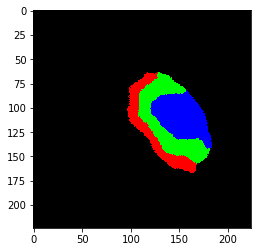

165436_rh


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


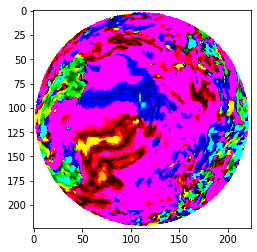

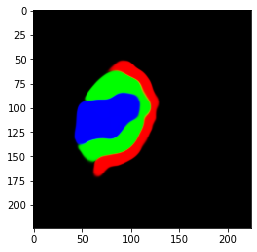

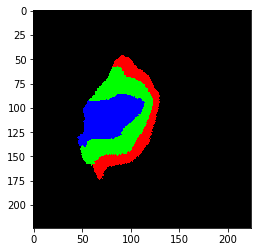

192641_lh


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


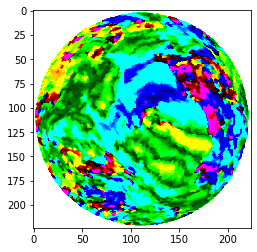

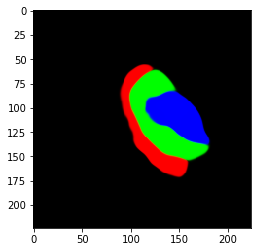

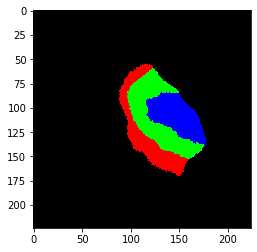

158035_lh


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


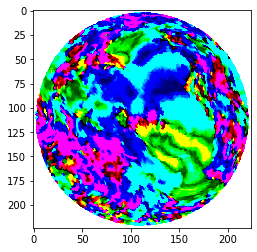

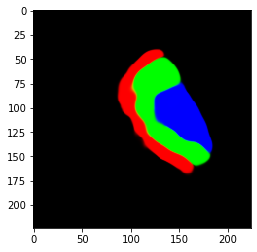

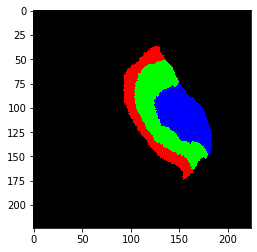

251833_rh


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


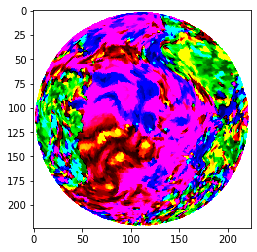

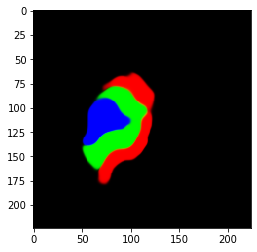

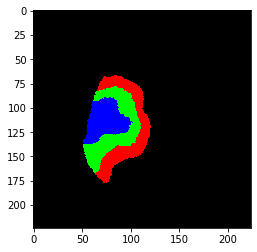

In [24]:
for idx, inputs, labels in test_loader:
    print(idx[0])
    pred = model(inputs)
    pred = torch.sigmoid(pred)
    pred = pred.data.cpu()
    plt.imshow(inputs[0].transpose(0,1).transpose(1,2))
    plt.show()
    plt.imshow(pred[0].transpose(0,1).transpose(1,2))
    plt.show()
    plt.imshow(labels[0].transpose(0,1).transpose(1,2))
    plt.show()
    #     plt.savefig('data/results2/'+str(sid)+'_'+str(h)+'_input.png', dpi=144)

# Save results

In [ ]:
for idx, inputs, labels in test_loader:
    pred = model(inputs)
    pred = torch.sigmoid(pred)
    pred = pred.data.cpu()
    plt.imshow(inputs[0].transpose(0,1).transpose(1,2))
    plt.savefig('data/results_fullset/'+str(idx[0])+'_input.png', dpi=144)
    plt.imshow(labels[0].transpose(0,1).transpose(1,2))
    plt.savefig('data/results_fullset/'+str(idx[0])+'_true.png', dpi=144)
    plt.imshow(pred[0].transpose(0,1).transpose(1,2))
    plt.savefig('data/results_fullset/'+str(idx[0])+'_pred.png', dpi=144)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i